<h3 style="text-align:center;">Group 27
    <br></br>

    
    Shakil Ahmed - 202402609
    Al Ashrif Bin Ahamed - 202402610
    
</h3>

# Data Mining - Handin 2 - Graph mining

This handin corresponds to the topics in Week 11-15 in the course.

The handin is 
* done in groups
* worth 10% of the grade

For the handin, you will prepare a report in PDF format, by exporting the Jupyter notebook. 
Please submit
1. The jupyter notebook file with your answers
2. The PDF obtained by exporting the jupyter notebook

**The grading system**: Tasks are assigned a number of points based on the difficulty and time to solve it. The sum of
the number of points is **100**. For the maximum grade you need to get at least _90 points_. The minimum grade (02 in the Danish scale)
requires **at least** 33 points, with at least 9 points from the first three Parts (Part 1,2,3) and 6 points in the last part (Part 4).
Good luck!

**The exercise types**: There are four different types of exercises
1. <span style='color: green'>**\[Compute by hand\]**</span> means that you should provide NO code, but show the main steps to reach the result (not all). 
2. <span style='color: green'>**\[Motivate\]**</span> means to provide a short answer of 1-5 lines indicating the main reasoning, e.g., the PageRank of a complete graph is 1/n in all nodes as all nodes are symmetric and are connected one another.
3. <span style='color: green'>**\[Prove\]**</span> means to provide a formal argument and NO code. 
4. <span style='color: green'>**\[Implement\]**</span> means to provide an implementation. Unless otherwise specified, you are allowed to use helper functions (e.g., ```np.mean```, ```itertools.combinations```, and so on). **However**, if the task is to implement an algorithm, by no means a call to a library that implements the same algorithm will be deemed as sufficient!

**Q&A**

Q: If the task is to implement a mean function, may I just call ```np.mean()```? 
<br>A: No.

Q: If the task is to compare the mean of X and Y, may I use ```np.mean()``` to calculate the mean?
<br>A: Yes.

Q: If I have implemented a mean function in a previous task, but I am unsure of its correctness, may I use ```np.mean()``` in following task where mean is used as a helper function? 
<br>A: Yes.

Q: May I use ```np.mean()``` to debug my implementation of mean?
<br>A: Yes.

Q: Do I get 0 points for a task if I skip it?
<br>A: Yes.

Q: Can I get partial points for a task I did partially correct?
<br>A: Yes.

Q: Is it OK to skip a task if I do not need the points from it?
<br>A: Yes.

Q: Should I inform a TA if I find an error?
<br>A: Yes.

Q: Should I ask questions if I am confused?
<br>A: Yes.



Good luck!

<span style="color:red">New packages have been added to "requirements.yml". To install them, go to the root of the repository and run:
```
conda activate dm25
conda env update -f requirements.yml --prune
```
</span>

<span style="color:red">or install them manually:
```
pip install networkx
pip install torch
pip install torchvision
```
</span>



In [1]:
### BEGIN IMPORTS - DO NOT TOUCH!
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
import sys
sys.path.append('..')
#!{sys.executable} -m pip install networkx
#!{sys.executable} -m pip install torch
#!{sys.executable} -m pip install torchvision
import random
import scipy.io as sio
import time

import networkx as nx
import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

import csv
from itertools import count


import torch
import torch.optim
import torch.nn as nn
import torch.nn.functional as F
import pickle

### END IMPORTS - DO NOT TOUCH!

## Task 1.1 Random walks and PageRank  (10 points)

In this exercise recall that the PageRank is defined as 
$$\mathbf{r} = \alpha \mathbf{Mr} + (1-\alpha)\mathbf{p}$$ 
where $\mathbf{r}\in \mathbb{R}^n$ is the PageRank vector, $\alpha$ is the restart probability, $\mathbf{M} = A\Delta^{-1}$, and $\mathbf{p}$ is the restart (or personalization) vector. 

### Task 1.1.1 (2 points)
What is the PageRank of a **$d$-regular** graph with $n$ nodes and $\alpha=1$? 

<span style='color: green'>**\[Motivate\]**</span> your answer without showing the exact computation. 

****
<span style="color:red">**YOUR ANSWER HERE**</span>
****

In a **$d$-regular graph**, every node has exactly the same degree, meaning the structure is completely symmetric. When $\alpha$=1, the PageRank equation simplifies to:

$$\mathbf{r} = \mathbf{Mr}$$ 

Here, $\mathbf{M}$ is the normalized adjacency matrix, and in a **$d$-regular graph**, this matrix is such that every node distributes its rank equally among its $d$ neighbors. Because of the symmetry, no node has an advantage over any other. This means that the unique stationary distribution (the eigenvector corresponding to the eigenvalue 1) is the uniform distribution over all nodes. Hence, each node in the graph has the same PageRank value, which is:

$$\frac{1}{n}$$

Thus, the PageRank of a **$d$-regular graph** with $n$ nodes and $\alpha=1$ is uniform, with each node having a PageRank of $\frac{1}{n}$.

### Task 1.1.2 (6 points)
Look at the graph below (run the code) and try to make a guess about the PageRank values of each node by only looking at the graph.

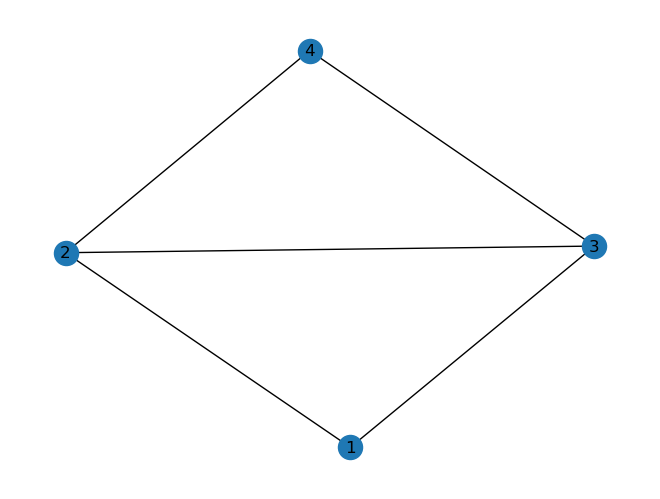

In [2]:
G = nx.Graph()
G.add_edges_from([(1,2),(2,3), (2,4), (3,4), (1,3)])
nx.draw(G, with_labels=True,)

<span style='color: green'>**A) \[Implement\]**</span> the PageRank for $\alpha=1$ for the graph using the Power Iteration method (use $\epsilon=1e-16$ to stop the iteration).<br> 

<span style='color: green'>**B) \[Implement]**</span> Plot the norm square difference of the $r$ vector between two iterations. 

<span style='color: green'>**C) \[Motivate\]**</span> Do you observe a constanct decrease of the norm square difference as iterations are increasing, and is it expected or not?

<span style='color: green'>**D) \[Implement\]**</span> the PageRank for $\alpha=1$ using the eigenvector method.<br> 

<span style='color: green'>**E) \[Motivate\]**</span> Are solutions of both methods the same? Why don't we only use the eigenvector method that optimally solves the problem? 

<span style='color: green'>**F) \[Motivate\]**</span> Do the real eigenvalues match with your first guess? Can you see a pattern between the eigenvalues of each node and its edges?   

In [3]:
#A) YOUR CODE HERE 
nodes = list(G.nodes())
nodes.sort()
n = len(nodes)
node_index = {node: i for i, node in enumerate(nodes)}

# adjacency matrix A as a nested list
A = [[0 for _ in range(n)] for _ in range(n)]
for u, v in G.edges():
    i, j = node_index[u], node_index[v]
    A[i][j] = 1
    A[j][i] = 1  # undirected graph: add both directions

# Compute the degree of each node
degrees = [0] * n
for j in range(n):
    for i in range(n):
        degrees[j] += A[i][j]

# Build the column-stochastic matrix M = A * (Delta^{-1})
M = [[0 for _ in range(n)] for _ in range(n)]
for j in range(n):
    if degrees[j] > 0:
        for i in range(n):
            M[i][j] = A[i][j] / degrees[j]

# Initialize the PageRank vector r uniformly
r = [1 / n for _ in range(n)]
epsilon = 1e-16
norm_diffs = []  # list to record squared L2 norm differences between iterations [for Q: B]
delta = float('inf')
iteration = 0

while delta > epsilon:
    # PageRank vector r_new = M * r
    r_new = [0] * n
    for i in range(n):
        total = 0
        for j in range(n):
            total += M[i][j] * r[j]
        r_new[i] = total

    diff_sq = sum((r_new[i] - r[i]) ** 2 for i in range(n))
    norm_diffs.append(diff_sq)
    
    # Update delta and the vector r
    delta = diff_sq
    r = r_new
    iteration += 1

print("Power iteration converged after", iteration, "iterations")
print("PageRank vector:")
for i in range(n):
    print("Node", nodes[i], ":", r[i])


Power iteration converged after 43 iterations
PageRank vector:
Node 1 : 0.19999999866018162
Node 2 : 0.30000000133981786
Node 3 : 0.30000000133981786
Node 4 : 0.19999999866018162


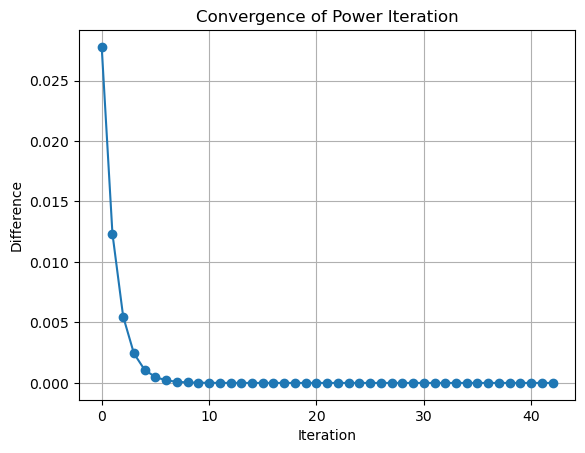

In [4]:
#B) YOUR CODE HERE 
plt.figure()
plt.plot(norm_diffs, marker='o')
plt.xlabel("Iteration")
plt.ylabel("Difference")
plt.title("Convergence of Power Iteration")
plt.grid(True)
plt.show()

<span style="color:red"> C) YOUR ANSWER HERE</span>


Yes, we can see a decrease of the norm square difference as iterations are increasing, but it is not perfectly constant. Early iterations show a fast drop in the difference as the vector quickly moves toward the dominant eigenvector. Moreover, As the iterations progress, the differences shrink at a slower, non-linear rate, approaching zero asymptotically. This behavior is expected because the convergence rate of the power iteration is dictated by the spectral gap - the ratio between the second largest eigenvalue in magnitude and the dominant eigenvalue, which is $1$. So, the non-constant, exponentially decaying pattern in the norm square difference is completely normal and expected.

In [5]:
#D) YOUR CODE HERE
M_np = np.array(M)

# Compute the eigenvalues and eigenvectors of M.
eigvals, eigvecs = np.linalg.eig(M_np)
index = np.argmax(np.real(eigvals))
r_eig = np.real(eigvecs[:, index])
r_eig = r_eig / np.sum(r_eig)

print("PageRank computed using the Eigenvector Method (alpha = 1):")
for i, node in enumerate(nodes):
    print(f"Node {node}: {r_eig[i]:.4f}")

PageRank computed using the Eigenvector Method (alpha = 1):
Node 1: 0.2000
Node 2: 0.3000
Node 3: 0.3000
Node 4: 0.2000


<span style="color:red"> E) YOUR ANSWER HERE</span>

As we can see that both methods theoritically converge to the same solution (negligible difference). Even though the **eigenvector** method gives the optimal solution, it is computationally expensive (requires a full eigen-decomposition of $\mathbf{M}$), especially for very large graphs. Therefore, the **power iteration** method is preferred for scalability. It is simple, memory efficient, and works well even when the graph has billions of nodes (real-world applications).

<span style="color:red"> F) YOUR ANSWER HERE</span>

As our first guess by seeing the graph, we expected to see an eigenvalue of $1$ because of the way $\mathbf{M}$ is built, and we do. The eigenvector corresponding to the eigenvalue $1$ gives the PageRank vector. In that vector, nodes with more edges (higher degree) tend to have higher PageRank values. In our case, nodes 2 and 3 (each with three edges) receive higher scores than nodes 1 and 4 (each with two edges).

### Task 1.1.3 (2 points)

<span style='color: green'>**\[Motivate\]**</span> Assume you have embedded the graph in **1.1.2** with a __Linear Embedding__ using unnormalized Laplacian matrix of the graph as the similarity matrix. How do you expect the embeddings to be if the embedding dimension is $d = 1$? 

* [ ] Nodes 1, 2, 3, 4 will be placed in the corners of a hypercube
* [ ] Nodes 2,3 will have the same embedding while 1,4 will be far from each other.
* [x] Nodes 1,4 have the same embedding and 2,3 will have very close embeddings.
* [ ] Nodes 3,4 will be very far apart.

****
<span style="color:red">**YOUR ANSWER HERE**</span>
******************

Both of nodes (1,4) have exactly the same neighbors (they are each connected only to nodes 2 and 3). This symmetry forces them to have the same value in the linear embedding. Otherhand, nodes (2, 3) are also symmetric (each is connected to 1, 3 or 2, and 4) and are more central in the graph. As a result, they will end up with very close or even identical embedding values that are different from the value for nodes 1 and 4.

## Task 1.2: Spectral Properties of the Graph Laplacian (10 points)
 <span style='color: green'>**\[Prove\]**</span> **the following properties:**
 You will be given points for each of the properties that you prove, rather than points for the exercise as a whole.

**Note that all question correspond to the eigenvalues of the LAPLACIAN (NOT THE NORMALIZED)**

For a graph with $n$ nodes the eigenvalues of the LAPLACIAN ($L  = D - A$) is noted as:<br>
**$\lambda_0\leq\lambda_1\leq...\leq\lambda_{n-1}$**

### Task 1.2.1 (2 points)

For all graphs $\lambda_0 = 0$ 

*******************
<span style="color:red">**YOUR ANSWER HERE**</span>
******************

Here, D = Degree matrix and A = Adjacency matrix.

And, the **LAPLACIAN matrix $\mathbf{L}$** is symmetric and positive semi-definite, so all eigenvalues are non-negative **$\lambda_0 \ge 0$**. 

If we consider the vector of all ones $\mathbf{1} = [1, 1, ..., 1]$

Since $L = D - A$, we can write:
$$(L\mathbf{1})_i = \sum_{j=1}^n (D_{ij} - A_{ij}) \cdot 1$$

The degree matrix $D$ is diagonal, with $D_{ii} = d_i$ (the degree of node $i$) and $D_{ij} = 0$ for $i \neq j$. So:
$$(L\mathbf{1})_i = d_i - \sum_{j=1}^n A_{ij}$$

Now, $\sum_{j=1}^n A_{ij}$ is the sum of the $i$-th row of the adjacency matrix, which counts the number of neighbors of node $i$. This is exactly the degree $d_i$ of node $i$.

Therefore:
$$(L\mathbf{1})_i = d_i - d_i = 0$$

This holds for every $i \in \{1, 2, \ldots, n\}$, so $L\mathbf{1} = \mathbf{0}$.

Since $L\mathbf{1} = \mathbf{0}$, this means that $\mathbf{1}$ is an eigenvector of $L$ with eigenvalue 0.

To show that $\lambda_0 = 0$ is the smallest eigenvalue, I'll use the fact that the Laplacian matrix $L$ is positive semi-definite. This means that for any vector $\mathbf{x} \in \mathbb{R}^n$:
$$\mathbf{x}^T L \mathbf{x} \geq 0$$

This implies that all eigenvalues of $L$ are non-negative. Since we have already found an eigenvalue 0 (with corresponding eigenvector $\mathbf{1}$), the smallest eigenvalue must be $\lambda_0 = 0$.

Therefore, for all graphs, the smallest eigenvalue of the Laplacian matrix is $\lambda_0 = 0$.

### Task 1.2.2 (2 points)
For the complete graph, $\lambda_1, \dots, \lambda_{n-1} = n$

*******************
<span style="color:red">**YOUR ANSWER HERE**</span>
******************

For a complete graph with $n$ nodes, every node is connected to all other nodes. Therefore:
- Each node has degree $d_i = n-1$
- The degree matrix $D$ is $(n-1)I$, where $I$ is the $n \times n$ identity matrix
- The adjacency matrix $A$ has 0s on the diagonal and 1s everywhere else, so $A = J - I$ where $J$ is the all-ones matrix

The Laplacian matrix is given by:
$$L = D - A = (n-1)I - (J - I) = nI - J$$

Now, let's find the eigenvalues of this matrix.

We have already established in **Task 1.2.1** that $\lambda_0 = 0$ with eigenvector $\mathbf{1}$ (the all-ones vector).

For any vector $\mathbf{v}$ that is orthogonal to $\mathbf{1}$ (meaning $\mathbf{v}^T\mathbf{1} = 0$), we have:
$$L\mathbf{v} = (nI - J)\mathbf{v} = n\mathbf{v} - J\mathbf{v}$$

Since $\mathbf{v}$ is orthogonal to $\mathbf{1}$, $J\mathbf{v} = \mathbf{0}$ (because each row of $J$ is $\mathbf{1}^T$).

Therefore:
$$L\mathbf{v} = n\mathbf{v}$$

This means that $\mathbf{v}$ is an eigenvector of $L$ with eigenvalue $n$.

The space of vectors orthogonal to $\mathbf{1}$ has dimension $n-1$. So there are $n-1$ linearly independent eigenvectors with eigenvalue $n$.

Therefore, the eigenvalues of the Laplacian matrix for a complete graph are:
$$\lambda_0 = 0, \lambda_1 = \lambda_2 = \cdots = \lambda_{n-1} = n$$

### Task 1.2.3 (2 points)

For all the graphs with $k$ connected components $\lambda_0 = \lambda_1 =...=\lambda_ k = 0$

******************
<span style="color:red">**YOUR ANSWER HERE**</span>
******************

If a graph has $k$ disconnected components, its Laplacian matrix can be reordered into a **block diagonal form**:  
$$
L = \begin{bmatrix}
L_1 & 0 & \dots & 0 \\
0 & L_2 & \dots & 0 \\
\vdots & \vdots & \ddots & 0 \\
0 & 0 & \dots & L_k
\end{bmatrix},
$$  
where each $ L_i$  is the Laplacian of the $i$-th connected component.

For any connected component $ L_i$, from the proof in **Task 1.2.1**, we know that:
$$L_i1_i = 0$$

Since the $k$ connected components are disjoint, we can construct $k$ vectors each corresponding to one connected component that are nonzero on their component and zero elsewhere. These vectors are linearly independent. Thus, the Laplacian $L$ of a graph with $k$ connected components has at least $k$ linearly independent eigenvectors corresponding to the eigenvalue $0$

A graph with $k$ disconnected components has exactly $k$ zero eigenvalues in its Laplacian matrix:  
$$ {\lambda_0 = \lambda_1 = \dots = \lambda_k = 0} $$

### Task 1.2.4 (2 points)
Given a graph $G$ with eigenvalues of the laplacian $\lambda_0, \lambda_1,...,\lambda_{n-1}$.<br>
We remove a single edge from $G$ and we re-calculate the eigenvalues as $\lambda'_0, \lambda'_1,...,\lambda'_{n-1}$.<br>

Can we have $\lambda'_{i}>\lambda_{i}$ for some $0\leq i\leq n-1$? Why? Why not?

******************
<span style="color:red">**YOUR ANSWER HERE**</span>
*****************

Firstly, removing an edge from a graph $G$, the eigenvalues of the Laplacian matrix $L$ can only decrease or remain the same. Because, the eigenvalues vary according to the graph's connectedness; the more linked, the higher the eigenvalues. When we remove an edge from a graph, we lower its eigenvalues, which might result in a disconnected graph. Thus, removing an edge cannot increase any eigenvalue of the Laplacian matrix. All eigenvalues either stay the same or decrease. 

Therefore, $\lambda'_{i}>\lambda_{i}$ for some $0\leq i\leq n-1$ is not possible.

### Task 1.2.5 (2 points)
Suppose that the graph $G$ is consisted of two connected componentes of equal size named as $G_1$ and $G_2$.<br>
The Laplacian of $G_1$ has eigenvalues $\lambda^1_0,\lambda^1_1,...,\lambda^1_{n/2-1}$.<br>
The Laplacian of $G_2$ has eigenvalues $\lambda^2_0,\lambda^2_1,...,\lambda^2_{n/2-1}$.<br>
Prove that the  Laplacian of $G$ is consisted of the eigenvalues of the Laplacians of $G_1$ and $G_2$ in ascending order.

******************
<span style="color:red">**YOUR ANSWER HERE**</span>
******************

The Laplacian matrix $L$ of $G$ is a **block diagonal matrix**:
$$
L = \begin{bmatrix}
L_1 & 0 \\
0 & L_2
\end{bmatrix},
$$
where $L_1$ is the Laplacian matrix of $G_1$, $L_2$is the Laplacian matrix of $G_2$

The eigenvalues of a block diagonal matrix are the **union of the eigenvalues of its blocks**. Therefore:
$$
L = L_1 \cup L_2
$$

We know, **from 1.2.1**
- Each connected component $G_1$ and $G_2$ contributes **one zero eigenvalue**
- Thus, $L$ has two zero eigenvalues:  
  $$ \lambda_0^1 = 0 \quad \text{and} \quad \lambda_0^2 = 0 $$

Let the eigenvalues of $L_1$ and $L_2$ be:
$$
\begin{align*}
\text{Eigenvalues}(L_1) &= \{0, \lambda_1^1, \lambda_2^1, \dots, \lambda_{n/2-1}^1\} \\
\text{Eigenvalues}(L_2) &= \{0, \lambda_1^2, \lambda_2^2, \dots, \lambda_{n/2-1}^2\}
\end{align*}
$$
The eigenvalues of $L$ are the union of these sets:
$$
\text{Eigenvalues}(L) = \{0, 0\} \cup \{\lambda_1^1, \dots, \lambda_{n/2-1}^1\} \cup \{\lambda_1^2, \dots, \lambda_{n/2-1}^2\}
$$
When sorted in ascending order:
$$
\lambda_0 \leq \lambda_1 \leq \dots \leq \lambda_{n-1}
$$

The eigenvalues of the Laplacian $L$ of $G$ are the union of the eigenvalues of $G_1$ and $G_2$, sorted in ascending order:
$$
\lambda_0 \leq \lambda_1 \leq \dots \leq \lambda_{n-1} \quad \text{where} \quad \{\lambda_i\} = \{\lambda_i^1\} \cup \{\lambda_i^2\}
$$

# Part 2: Graphs and Spectral clustering
In this part, you will experiment and reflect on spectral clustering as a technique for partitioning a graph. 

## Task 2.1 $\varepsilon$-neighbourhood graph (14 points)

In this subsection you will experiment with biological data https://journals.plos.org/ploscompbiol/article?id=10.1371/journal.pcbi.1003268.

First run the following code to load the data.

In [6]:
#Load Data
from utilities.make_graphs import read_edge_list, read_list, load_data
import numpy as np
X, Y = load_data()

******************
### Task 2.1.1 (4 points)
<span style='color: green'>**\[Implement\]**</span> the $\varepsilon$-neighborhood graph, using Euclidean (L2) distance. 

**Note**: Be sure that your constructed graph does not contain loop edges (edges from i to i for some node i)

In [7]:
#YOUR CODE HERE
# Be sure that your constructed graph does not 
# contain loop edges (edges from i to i for some node i)
from sklearn.neighbors import NearestNeighbors 

def nn_graph(data, eps, remove_self=True, directed=False):
    n = len(X)
    G = nx.Graph()    
    if directed:
        G = nx.DiGraph()
    ### YOUR CODE HERE
    # Because of the given imported scikit-learn package we have called the Eulidean method 
    G.add_nodes_from(range(n))
    nbrs = NearestNeighbors(radius=eps, algorithm='auto', metric='euclidean').fit(X)
    distances, indices = nbrs.radius_neighbors(X)
    
    for i in range(n):
        for j, dist in zip(indices[i], distances[i]):
            if remove_self and i == j:
                continue
            G.add_edge(i, j, weight=dist)
    ### YOUR CODE HERE
    return G

### Task 2.1.2 (2 points)


Try with different epsilons (select a small set of epsilons, e.g., 0.01-0.5 values) and plot the graphs. 

<span style='color: green'>**\[Motivate\]**</span> what you observe as epsilon increases. 

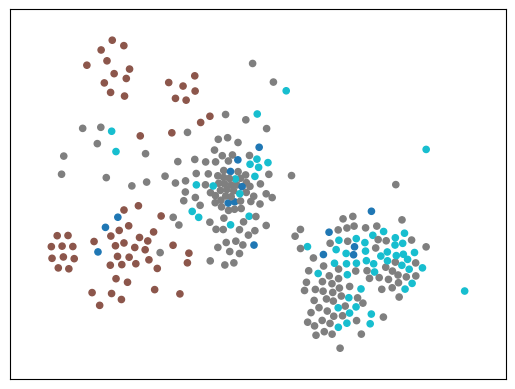

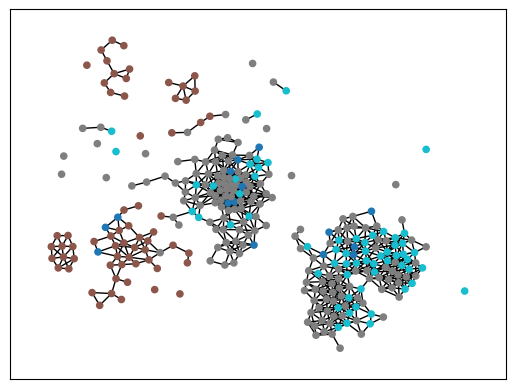

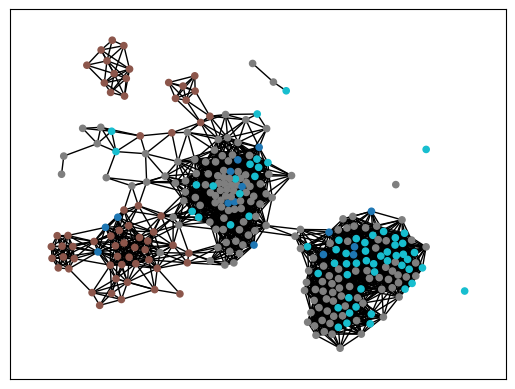

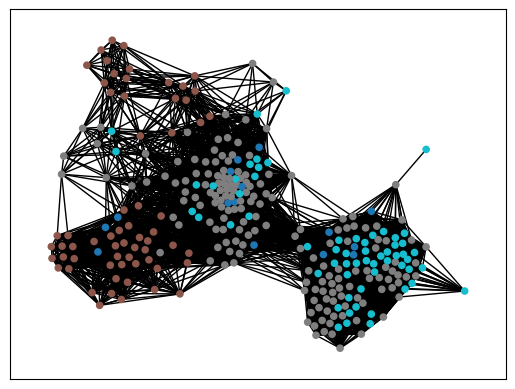

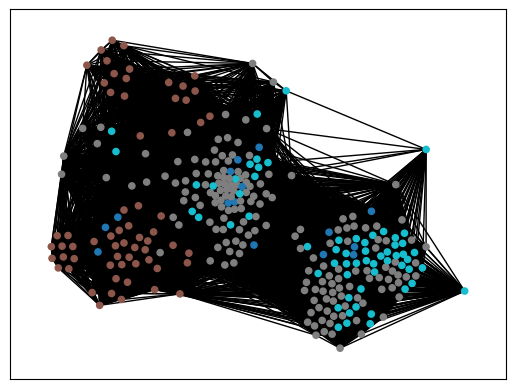

In [8]:
### Run the code below
eps_values = [0.01, 0.05, 0.1, 0.2, 0.4]

for eps in eps_values: 
    ax=plt.subplot()
    ax1=plt.subplot()
    G = nn_graph(X, eps)
    #G1=nx.numpyto
    pos=nx.spring_layout(G)  
    nx.draw_networkx_edges(G,pos=X)
    nx.draw_networkx_nodes(G, pos=X, node_color=Y, node_size=20, cmap=plt.get_cmap('tab10'))
    ax.set_xlim(-0.1, 1.1)
    ax.set_ylim(-0.1, 1.1)
    plt.show()

****
<span style="color:red">**YOUR ANSWER HERE**</span>
****

It gets more and more clustered together when we increases the $\epsilon$. With a very small **$\epsilon$ (0.01, 0.05)**, only very close neighbors are connected. As a result, many nodes are isolated and form tiny clusters. This is because only points with extremely close Euclidean distances are linked. As **$\epsilon$ (0.1, 0.2)** increases, more nodes fall within the neighborhood radius. We start to see more edges and small clusters begin to merge. So, The graph becomes denser, and some clusters join together. For even larger **$\epsilon$ (0.4)** values, nearly all nodes are connected to each others.

### Task 2.1.3 (4 points)

<span style='color: green'>**\[Implement\]**</span> a k-NN graph and compare with the $\varepsilon$-neighborhood graph. 

<span style='color: green'>**\[Motivate\]**</span> Under what conditions are they similar? 

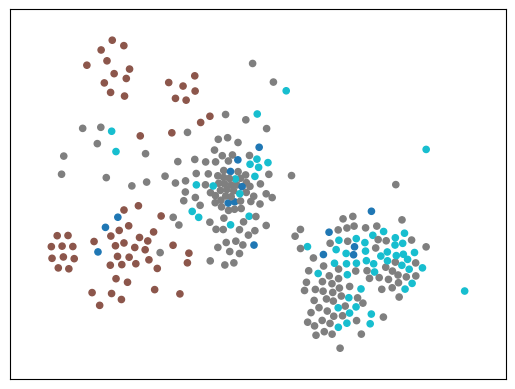

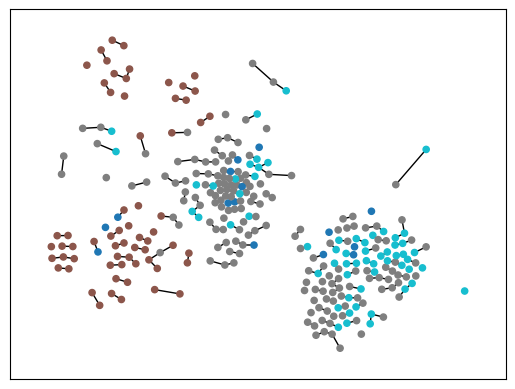

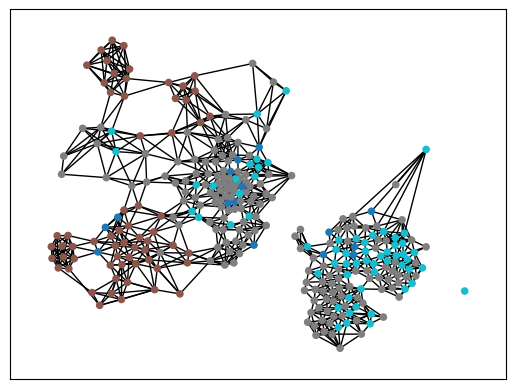

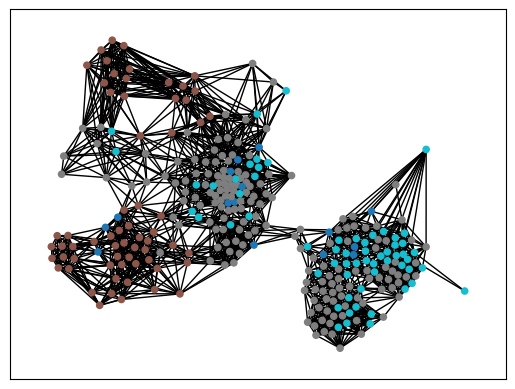

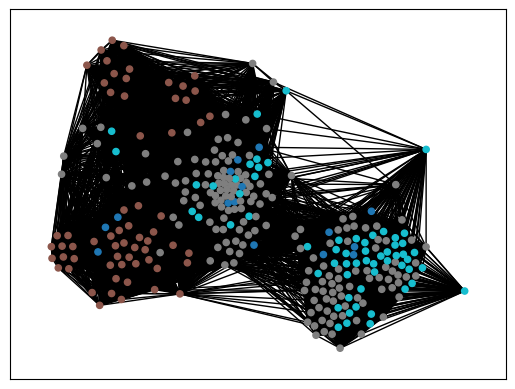

In [9]:
def knn_graph(data, k, remove_self=True, directed=False):
    n = len(data)  
    G = nx.DiGraph() if directed else nx.Graph()
    G.add_nodes_from(range(n))
    nn = NearestNeighbors(n_neighbors=k-1)  
    nn.fit(data)
    indices = nn.kneighbors(data, return_distance=False)  
    ##YOUR CODE HERE
    
    for i in range(n):
        neighbors = indices[i].tolist()
        if remove_self:
            neighbors = neighbors[1:]  # Remove self (first neighbor)
        for j in neighbors:
            if not directed and j < i:
                continue  # Avoid duplicates in undirected graphs
            G.add_edge(i, j)

    
    return G
k_values = [2, 3, 10, 20, 100]

for k in k_values:
    ax=plt.subplot()
    ax1=plt.subplot()
    G = knn_graph(X, k)
    #YOUR CODE HERE
    pos=nx.spring_layout(G)  
    nx.draw_networkx_edges(G,pos=X)
    nx.draw_networkx_nodes(G, pos=X, node_color=Y, node_size=20, cmap=plt.get_cmap('tab10'))
    ax.set_xlim(-0.1, 1.1)
    ax.set_ylim(-0.1, 1.1)
    plt.show()

****
<span style="color:red">**YOUR ANSWER HERE**</span>
****

When data points are evenly distributed in the feature space, a carefully chosen $\epsilon$ can yield a similar graph structure to a k-NN graph. Even, the value of $\epsilon$ should be selected to match the average distance to the k-th nearest neighbor across the dataset. If $\epsilon$ is set close to the average k-th neighbor distance, the two graphs will produce similar structures. However, in lower dimensional spaces, the relationship between k and $\epsilon$ is more predictable. As dimensionality increases (the curse of dimensionality), this relationship becomes less consistent.

### Task 2.1.4 (2 points)
Assign to each edge in the $\varepsilon$-neighborhood graph a weight

$$W_{i j}=e^{-\frac{\left\|\mathbf{x}_{i}-\mathbf{x}_{j}\right\|^{2}}{t}}$$

<span style='color: green'>**\[Implement\]**</span> the function ```weighted_nn_graph``` below that returns the weighted graph given the data matrix in input and the values eps and t, where t is the parameter of the equation above. 

In [10]:
def weighted_nn_graph(data, eps=20, t=0.1):
    n = len(data)
    G = nx.Graph()
    ### YOUR CODE HERE
    nbrs = NearestNeighbors(radius=eps, metric='euclidean').fit(data)
    distances, indices = nbrs.radius_neighbors(data)
    
    for i in range(n):
        for dist, j in zip(distances[i], indices[i]):
            if i == j:
                continue
            if i > j:
                continue
            weight = np.exp(- (dist ** 2) / t)
            G.add_edge(i, j, weight=weight)    
    ### YOUR CODE HERE
    return G

### Task 2.1.5 (2 points)

We now vary $t \in \{10, 0.1, 0.000001\}$. Plot the weights as a histogram in order to analyse the results using the provided code.</br>
What happens when $t$ is very small, close to $0$, i.e., $t \rightarrow 0$?</br> What happens when $t$ is very large?
</br>Is the behaviour with $t = 0$ expected?

<span style='color: green'>**\[Motivate\]**</span> your answer reasoning on the formula. 

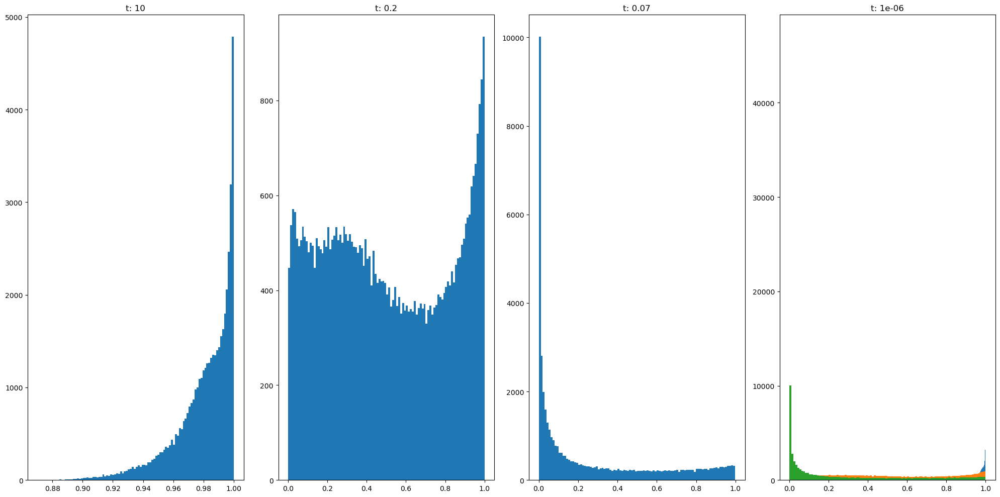

In [11]:
ts = [10, 0.2, 0.07, 0.000001]
fig, ax = plt.subplots(1,4, figsize=(20, 10))
row = 0

for i, t in enumerate(ts):
    G = weighted_nn_graph(X, eps=60, t=t)
    ys = []
    

    col = i 
    for i, d in enumerate(G.edges.data()):
        ys.append(d[2]['weight'])
    plt.hist(ys, bins=100)
    ax[col].hist(ys, bins=100)
    ax[col].set_title("t: "+str(t))
    
plt.tight_layout()

******************
<span style="color:red">**YOUR ANSWER HERE**</span>
******************

**`t` is very small:** 

The histogram shows a strong peak near 0 with a spike at 1 (if very close points exist), indicating that almost all edges have very small weights. This behavior is expected since the kernel becomes extremely sensitive to any difference in distance.

**`t` is very large:** 
The histogram will be concentrated near 1, indicating that nearly all edges have weights close to 1. Again, this is expected because a large `t` makes the kernel "flat," so differences in distances are washed out.

**`t` = 0:**
Undefined, computationally leads to errors.

## Task 2.2: Spectral clustering (20 points)

### Task 2.2.1 (2 points)
Compute the eigenvectors and eigenvalues (using the provided function) of the Normalized Laplacian and the Random Walk Laplacian of the graph $G$.<br> 
Plot the spectrum (eigenvalues).

<span style='color: green'>**\[Implement\]**</span> the code to compute the different Laplacians. 

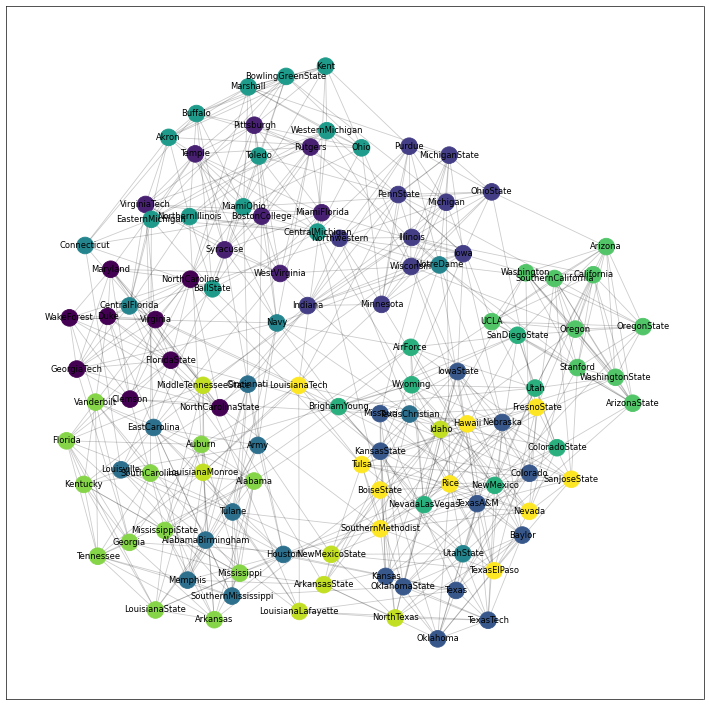

In [12]:
G = nx.read_gml('./data/football.gml')
groundTruth = [data['gt'] for _, data in G.nodes(data=True)]


fig = plt.figure(1, figsize=(15, 15), dpi=60)
layout = nx.kamada_kawai_layout(G)
nx.draw_networkx_edges(G, layout, alpha=0.2)
nx.draw_networkx_nodes(G, layout, node_color=groundTruth, node_size=400)
nx.draw_networkx_labels(G, layout, font_size=10)
plt.show()

In [13]:
def graph_eig(L): 
    """
        Takes a graph Laplacian and returns sorted the eigenvalues and vectors.
    """
    lambdas, eigenvectors = np.linalg.eig(L)
    lambdas = np.real(lambdas)
    eigenvectors = np.real(eigenvectors)
    
    order = np.argsort(lambdas)
    lambdas = lambdas[order]
    eigenvectors = eigenvectors[:, order]
    
    return lambdas, eigenvectors

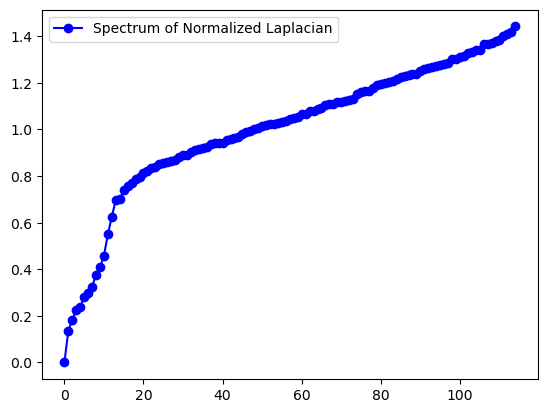

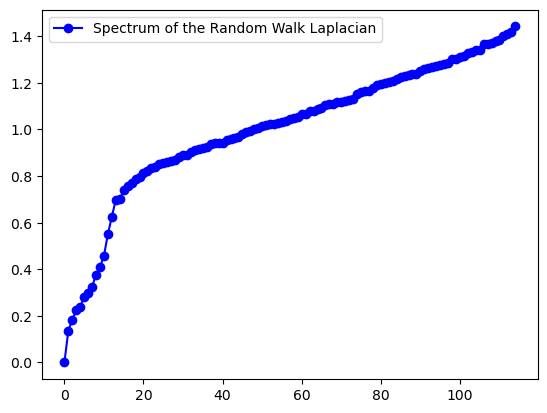

In [14]:
L_norm = None
L_rw = None
#nodeID = pickle.load(open('./data/nodeID.pickle', 'rb'))
### YOUR CODE HERE
def laplacian_norm(G):
    np_adj_G = nx.to_numpy_array(G)
    np_deg_G = np.diagflat(np.sum(np_adj_G, axis=0))
    np_deg_G_sqinv = np.linalg.inv(np.sqrt(np_deg_G))
    np_diag = np.diag(np.ones(np_adj_G.shape[0]))
    return np_diag - np_deg_G_sqinv @ np_adj_G @ np_deg_G_sqinv
def laplacian_rw(G):
    np_adj_G = nx.to_numpy_array(G)
    np_deg_G = np.diagflat(np.sum(np_adj_G, axis=0))
    np_deg_G_inv = np.linalg.inv(np_deg_G)
    np_diag = np.diag(np.ones(np_adj_G.shape[0]))
    return np_diag - np_deg_G_inv @ np_adj_G
L_norm = laplacian_norm(G)
L_rw = laplacian_rw(G)
### YOUR CODE HERE

eigval_norm, eigvec_norm = graph_eig(L_norm)
eigval_rw, eigvec_rw = graph_eig(L_rw)

plt.figure(0)
plt.plot(eigval_norm, 'b-o', label='Spectrum of Normalized Laplacian', )
plt.legend()
plt.figure(1)
plt.plot(eigval_rw, 'b-o', label='Spectrum of the Random Walk Laplacian')
plt.legend()

### Task 2.2.2 (5 points)
<span style='color: green'>**\[Implement\]**</span> the function ```spect_cluster``` that returns a vector ```y_clust``` in which each entry y_clust\[i\] represents the community assigned to node $i$. The method should be able to handle both the Normalized Laplacian, and the Random Walk Laplacian. You are allowed to use your implementation from the weekly exercises and ```sklearn.cluster.k_means``` for k-means clustering. 

In [15]:
from sklearn.cluster import k_means

def spect_cluster(G, eig_type="normal", k=5, d=5):
    ### YOUR CODE HERE
    if eig_type == "random":
        L = laplacian_rw(G)
    else:
        L = laplacian_norm(G)
    eigval, eigvec = graph_eig(L)
    sel = np.arange(len(eigval))[np.where(eigval > 1e-16)][:d]
    y_clust = k_means(eigvec[:, sel], k)[1]
    ### YOUR CODE HERE
    return y_clust

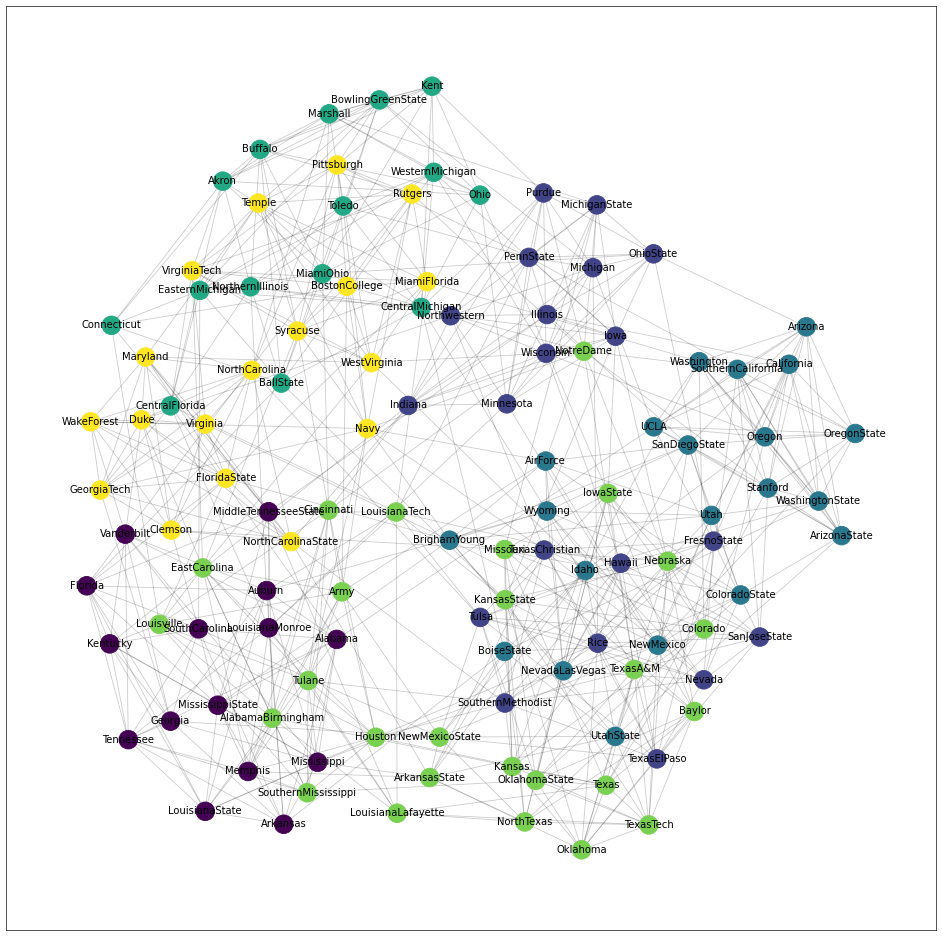

In [16]:
def plot_graph(G, clusters):
    fig = plt.figure(1, figsize=(20, 20), dpi=60)
    #nx.draw(G, pos=layout,with_labels = True, node_size=50, node_color=your_clusters,font_size=8, alpha=0.2)
    #layout = nx.spring_layout(H, k=5.15, iterations=20)
    layout = nx.kamada_kawai_layout(G)
    nx.draw_networkx_edges(G, layout, alpha = 0.2)
    nx.draw_networkx_nodes(G, layout, node_color=clusters, node_size=500)
    nx.draw_networkx_labels(G, layout)

your_clusters = spect_cluster(G, k=6)   
plot_graph(G, your_clusters)


### Task 2.2.3 (4 points)

Finally, use your implementation of spectral clustering with different Laplacians and different values of $k \in [3,10]$ and plot the results using the helper function ```plot_graph```. 

<span style='color: green'>**\[Motivate\]**</span> the results you obtain. Especially, what is the difference between the Random Walk and the Normalized Laplacians, if any? How do you explain such differences? Can you detect easily all the ground truth communities? Are some communities not detected? Why do you think that happens? 

Number of clusters: 3


<Figure size 1200x1200 with 0 Axes>

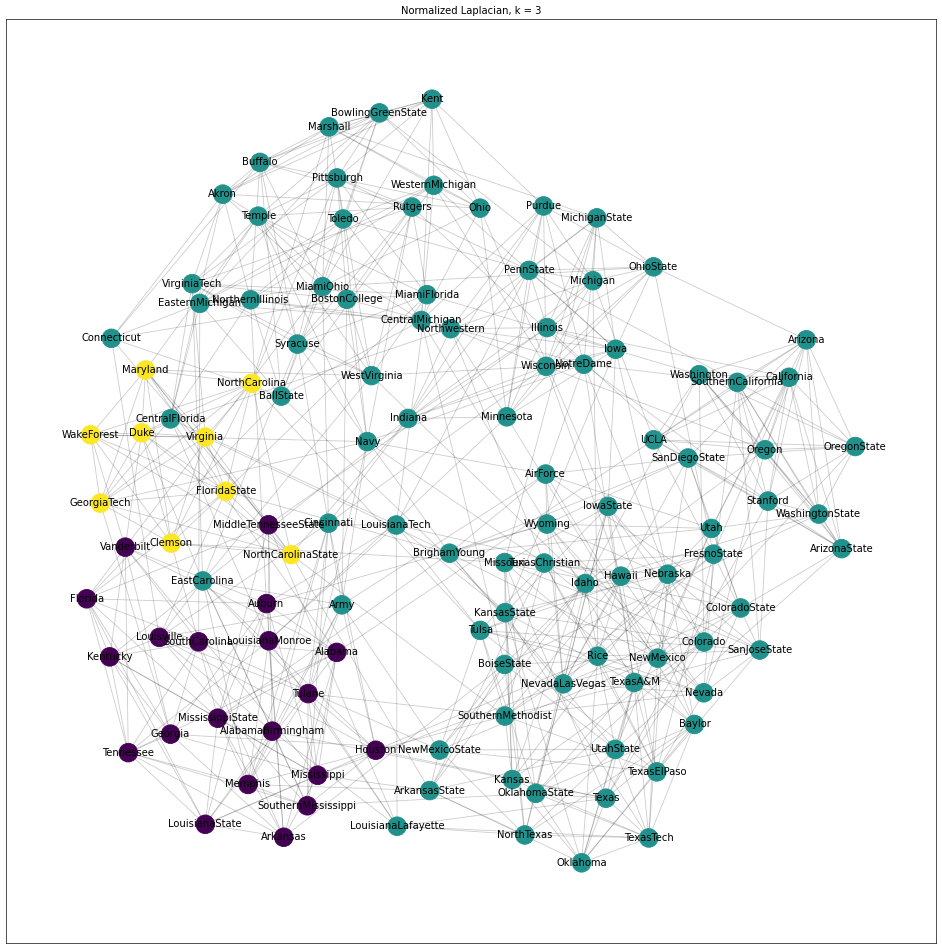

<Figure size 1200x1200 with 0 Axes>

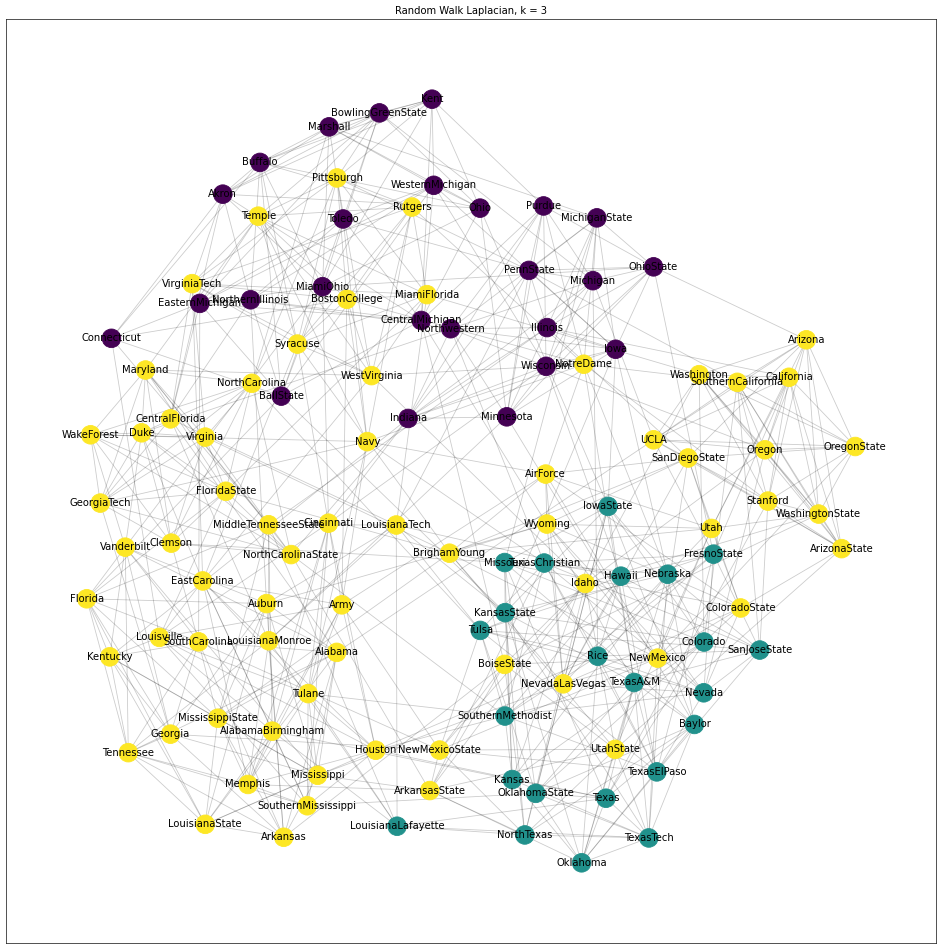

Number of clusters: 4


<Figure size 1200x1200 with 0 Axes>

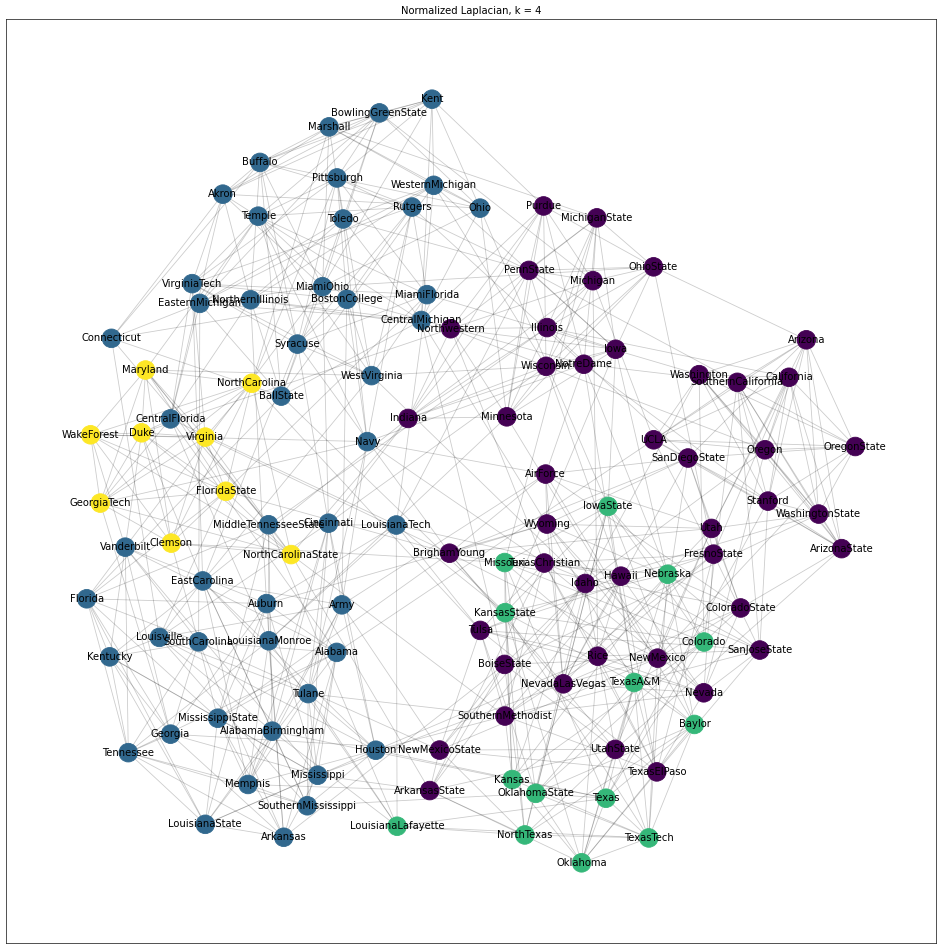

<Figure size 1200x1200 with 0 Axes>

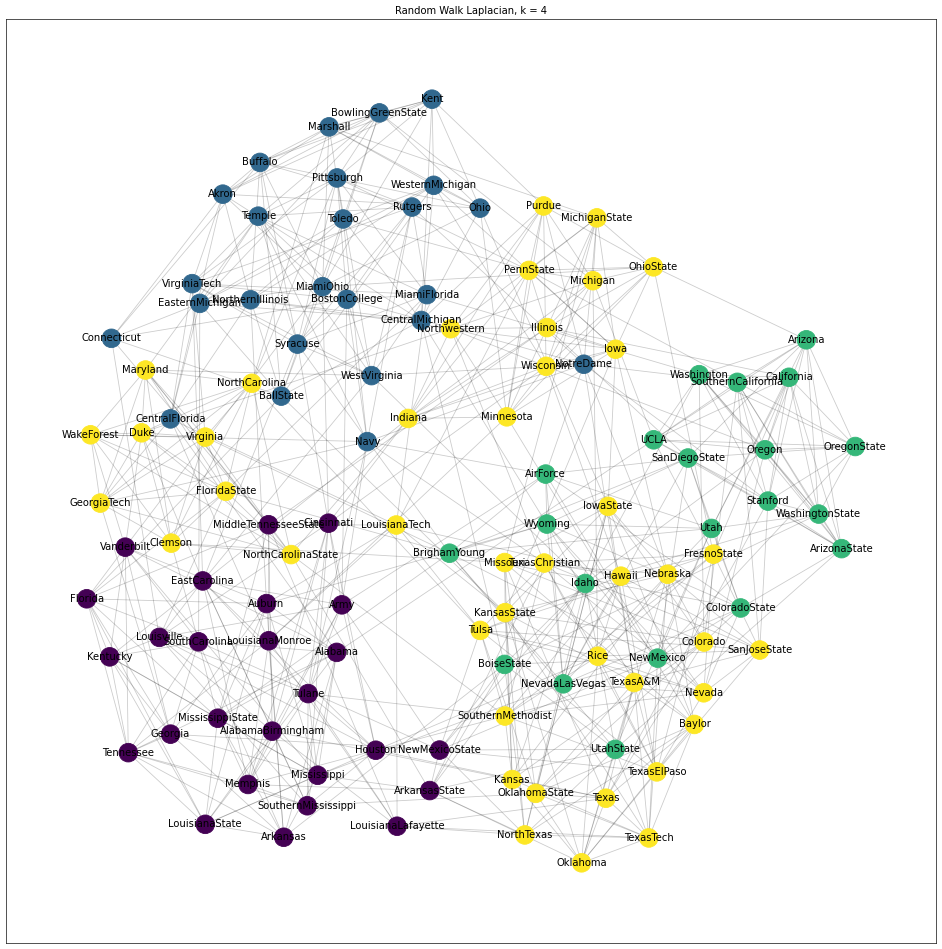

Number of clusters: 5


<Figure size 1200x1200 with 0 Axes>

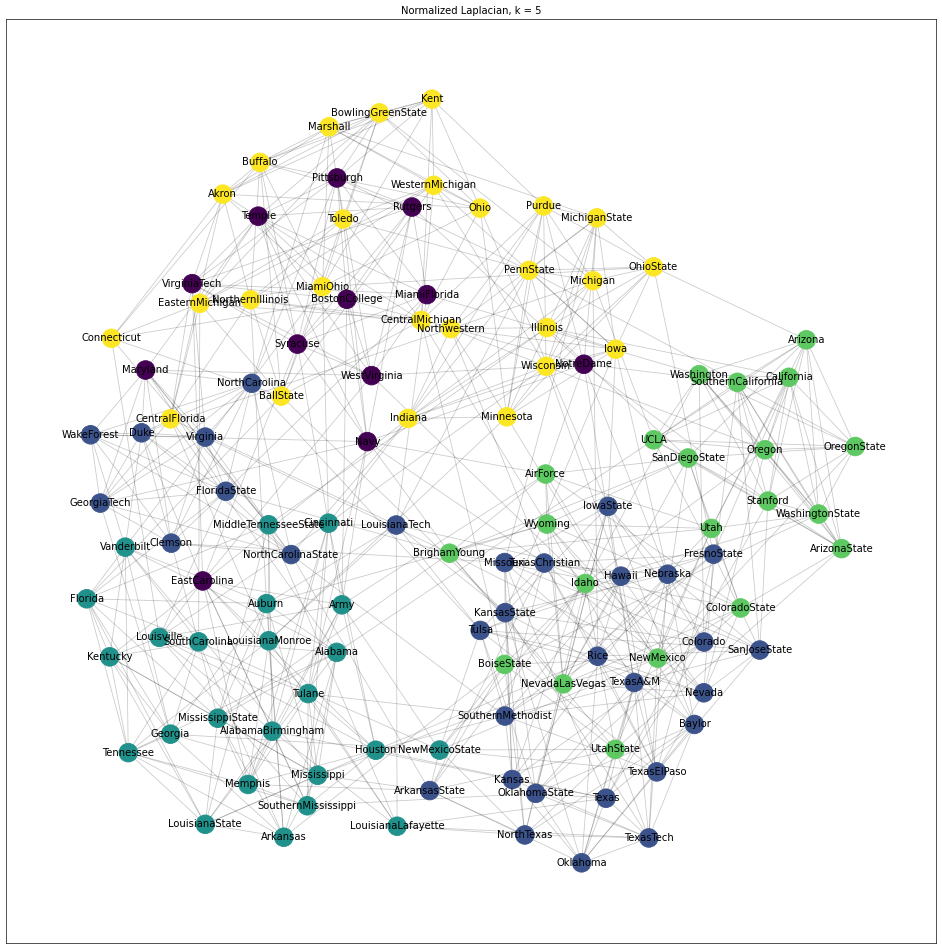

<Figure size 1200x1200 with 0 Axes>

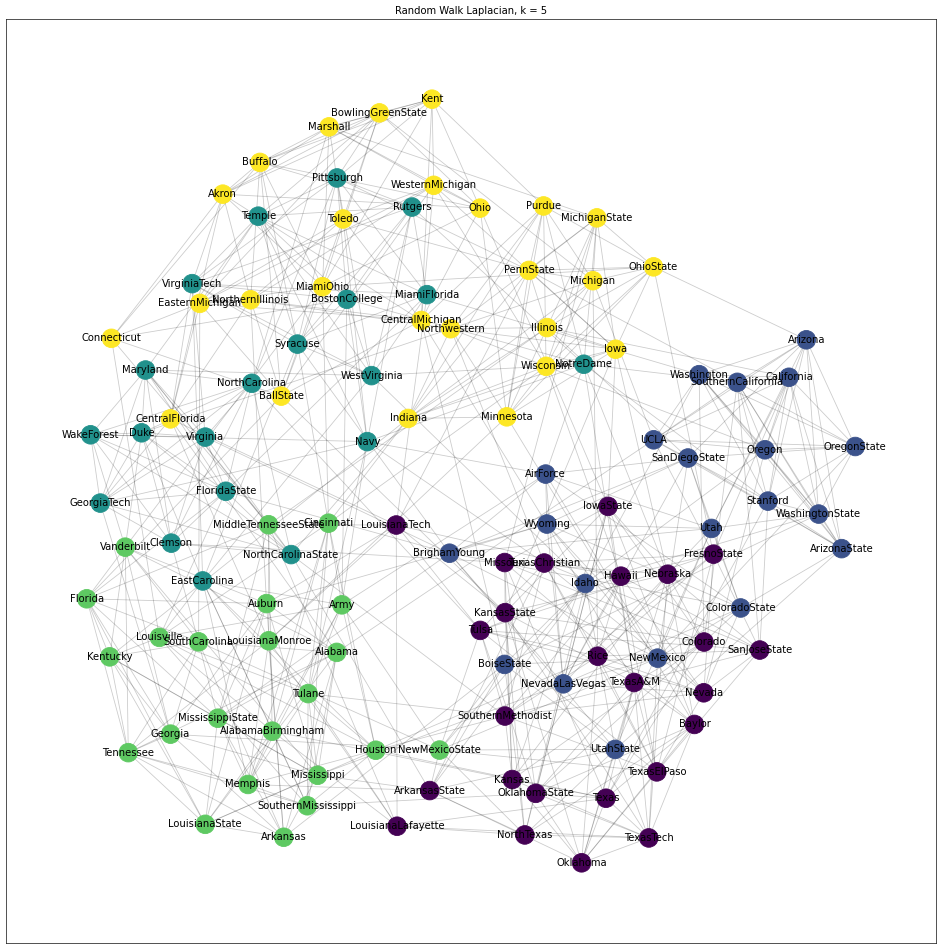

Number of clusters: 6


<Figure size 1200x1200 with 0 Axes>

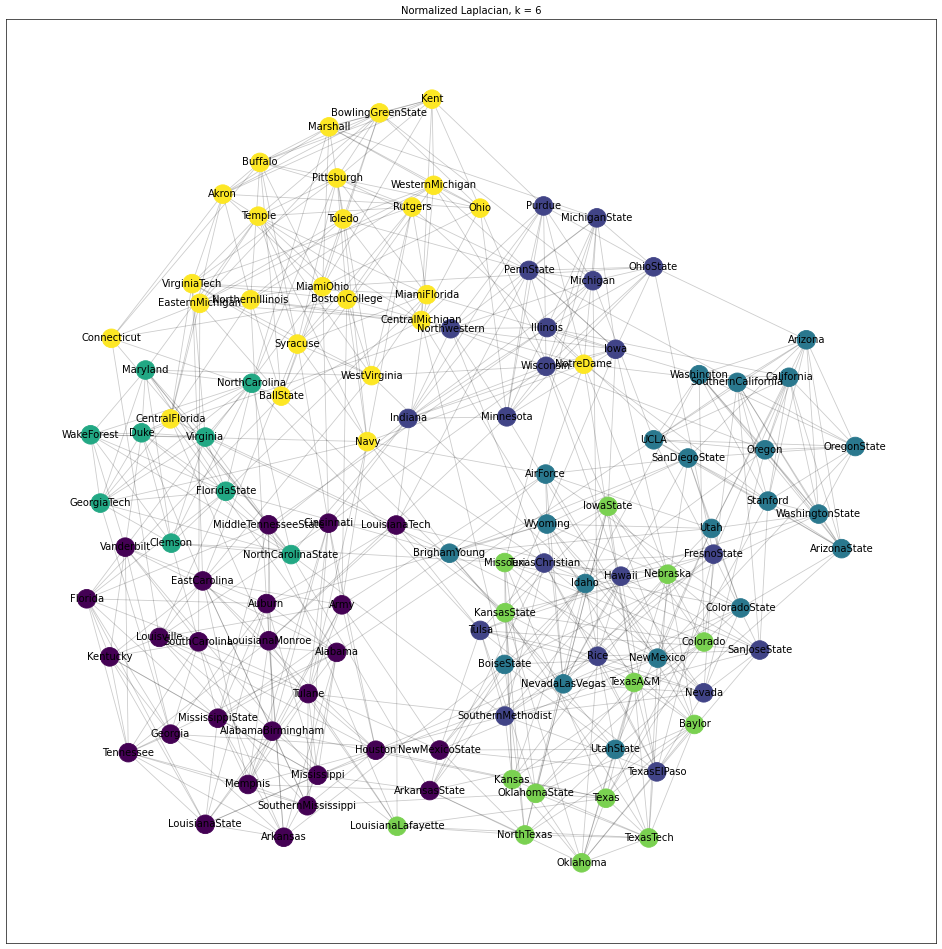

<Figure size 1200x1200 with 0 Axes>

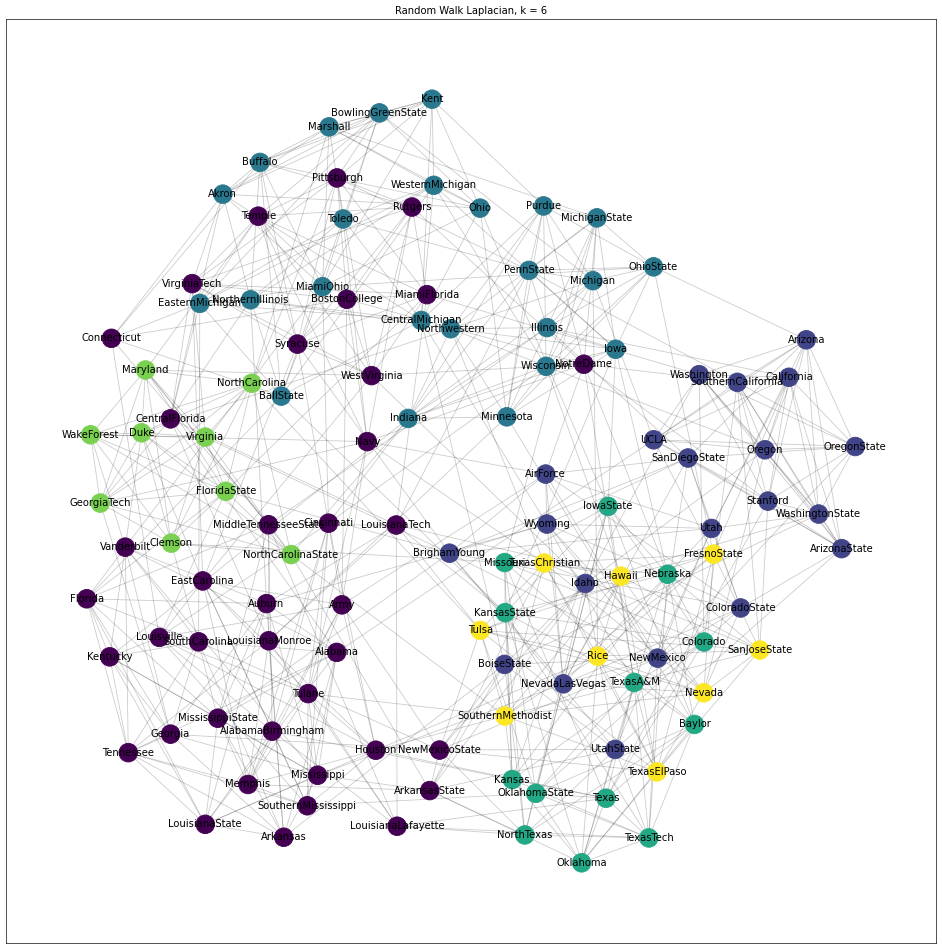

Number of clusters: 7


<Figure size 1200x1200 with 0 Axes>

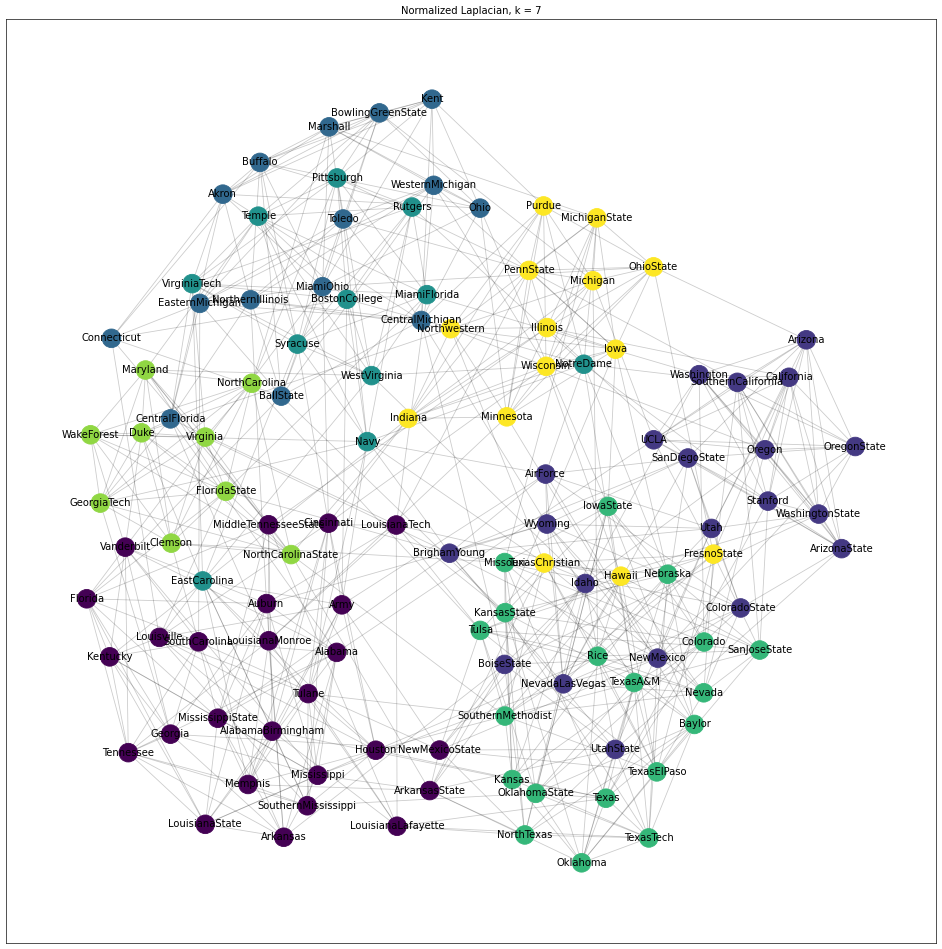

<Figure size 1200x1200 with 0 Axes>

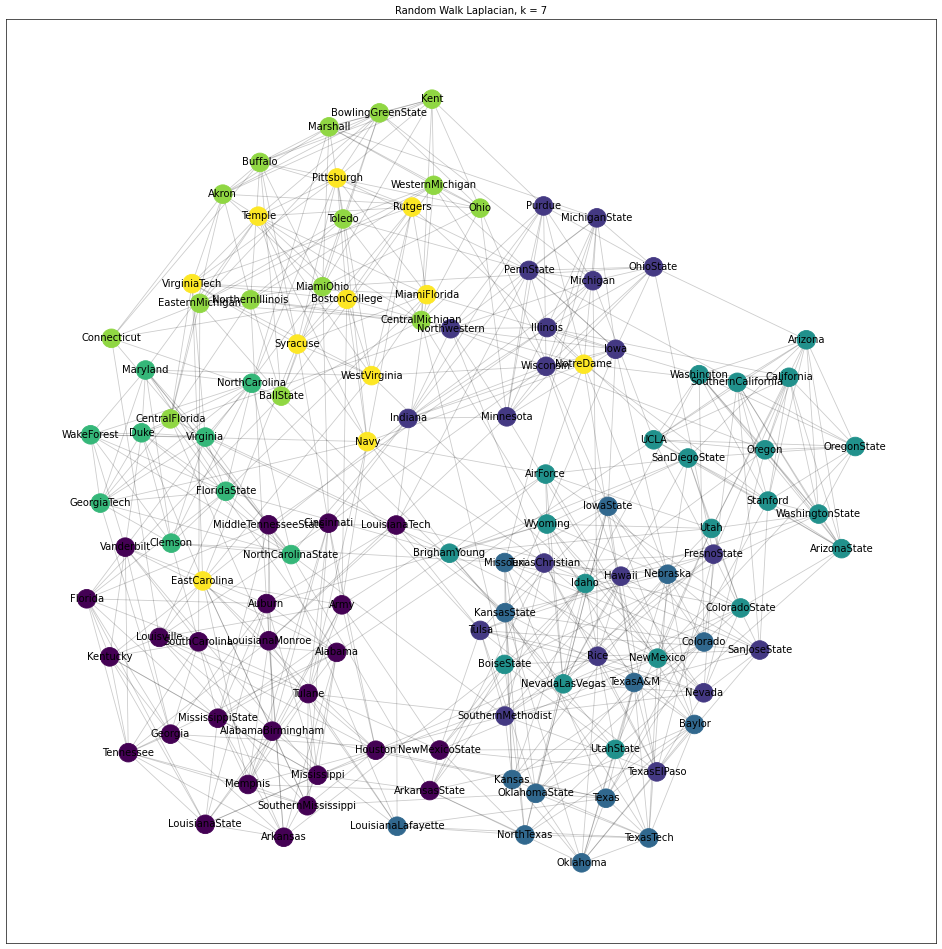

Number of clusters: 8


<Figure size 1200x1200 with 0 Axes>

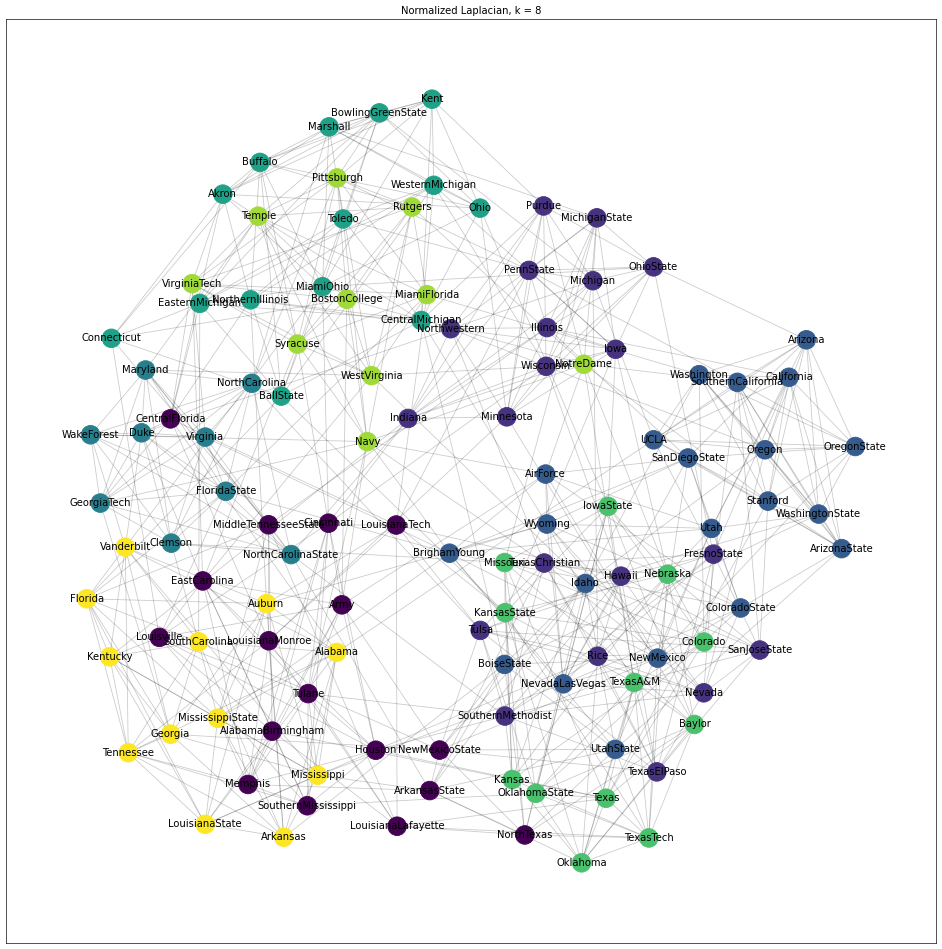

<Figure size 1200x1200 with 0 Axes>

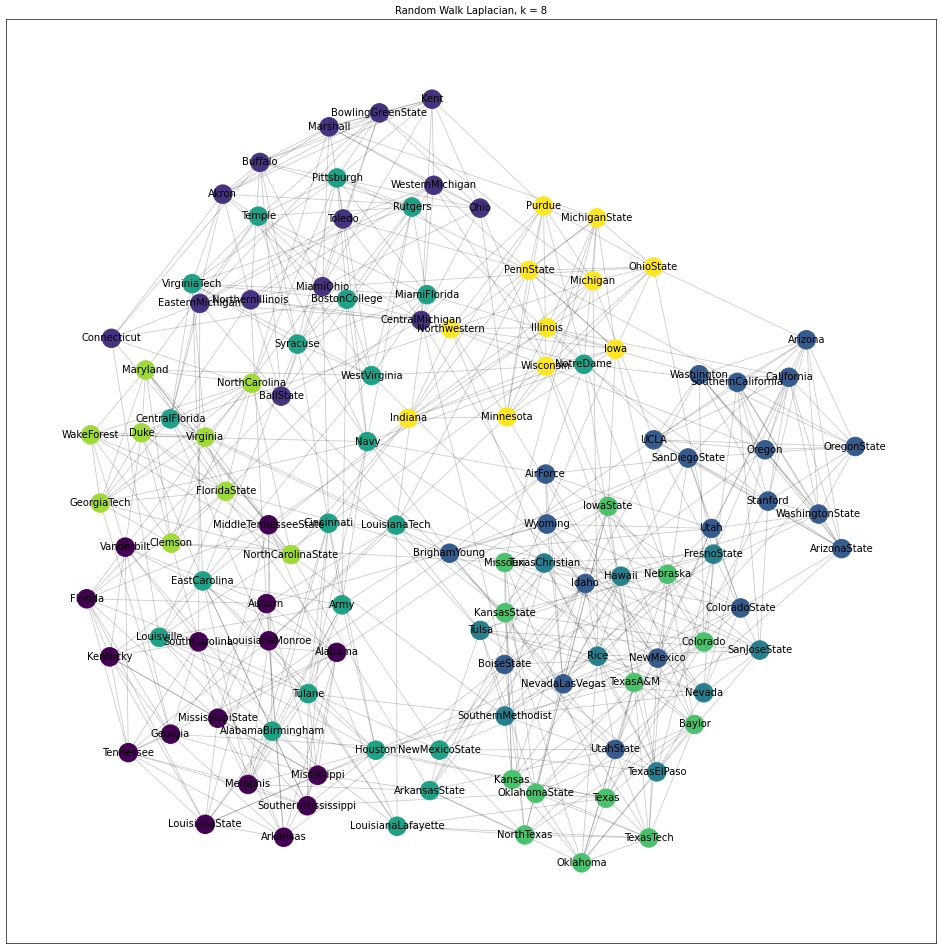

Number of clusters: 9


<Figure size 1200x1200 with 0 Axes>

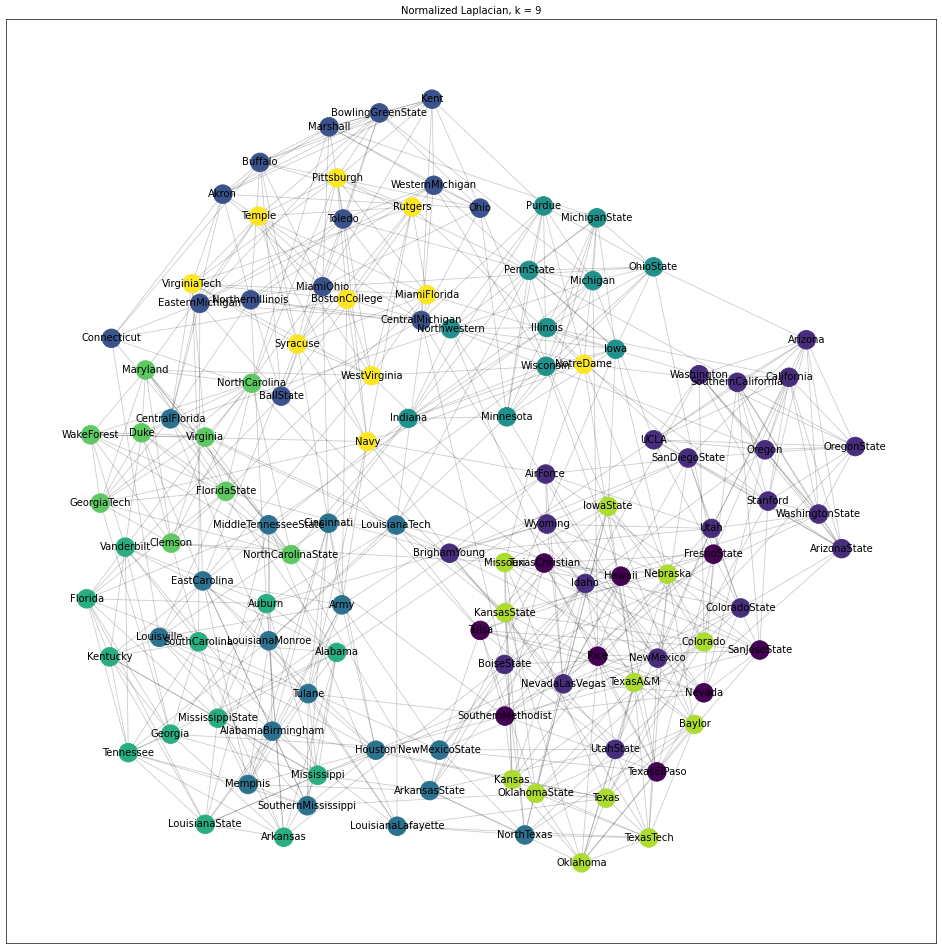

<Figure size 1200x1200 with 0 Axes>

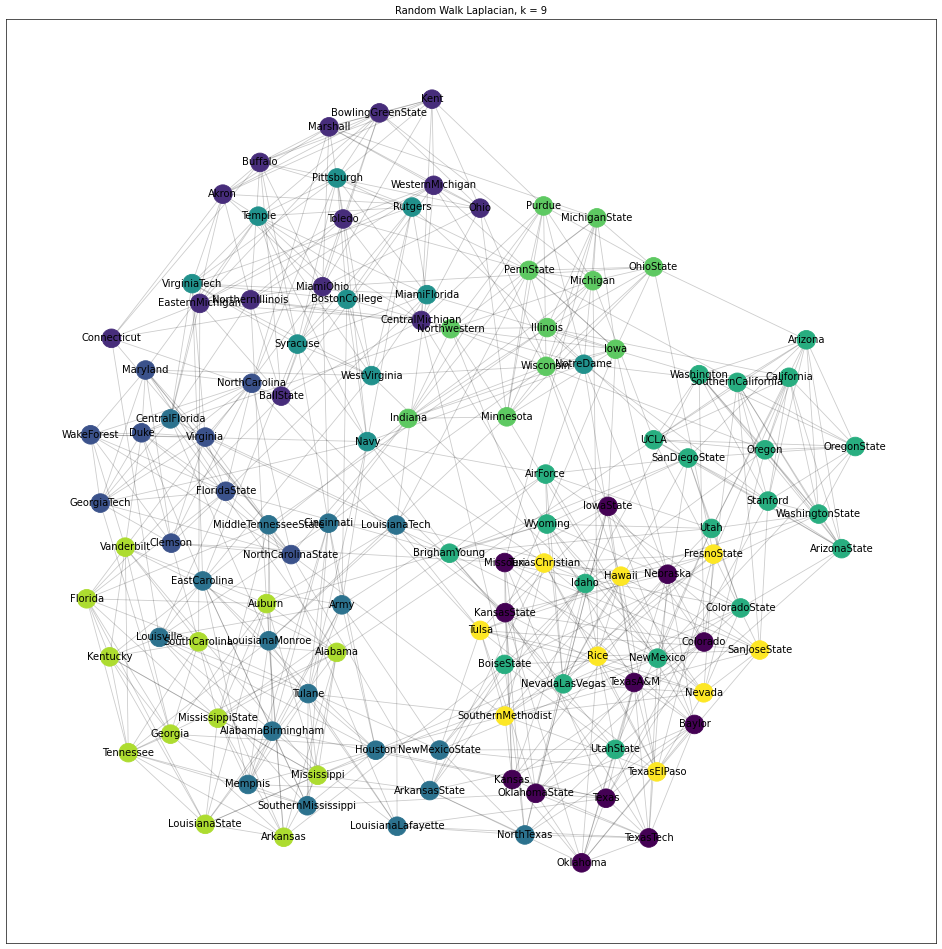

Number of clusters: 10


<Figure size 1200x1200 with 0 Axes>

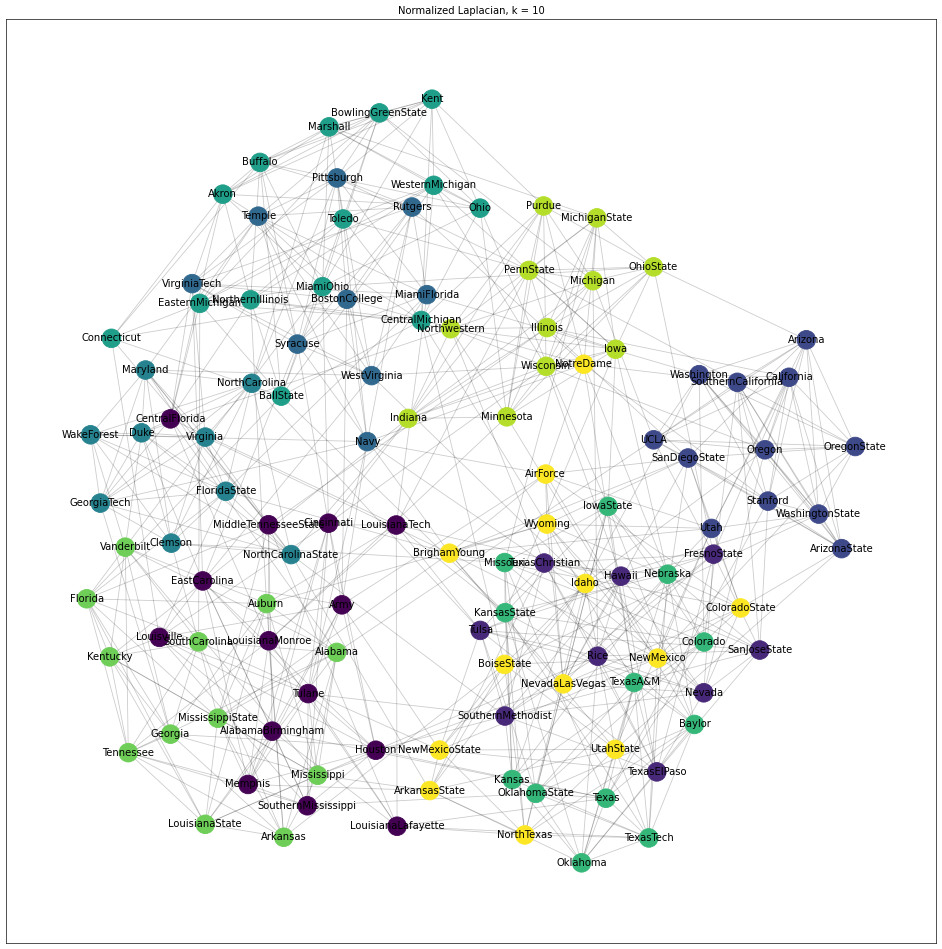

<Figure size 1200x1200 with 0 Axes>

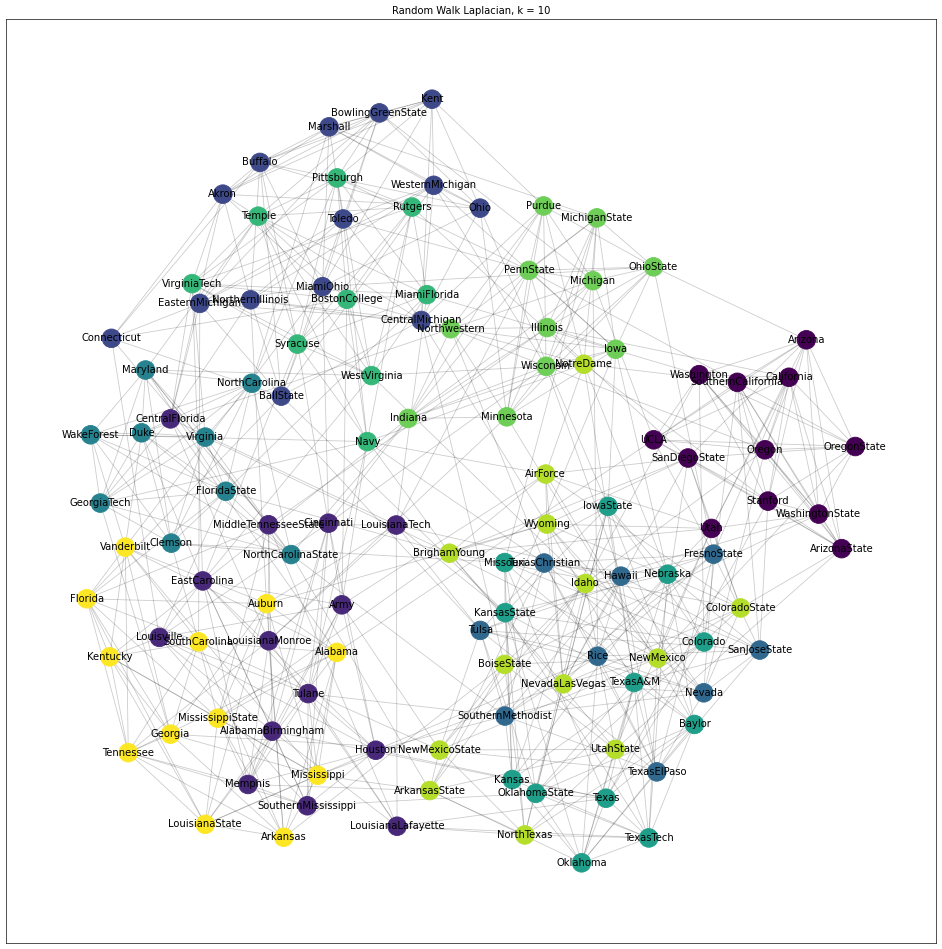

In [17]:
### YOUR CODE HERE
for k_val in range(3, 11):
    print(f"Number of clusters: {k_val}")

    # Spectral clustering using the Normalized Laplacian
    clusters_normal = spect_cluster(G, eig_type="normal", k=k_val, d=5)
    plt.figure(2, figsize=(20,20), dpi=60)
    plot_graph(G, clusters_normal)
    plt.title(f"Normalized Laplacian, k = {k_val}")
    plt.show()
    
    # Spectral clustering using the Random Walk Laplacian
    clusters_rw = spect_cluster(G, eig_type="rw", k=k_val, d=5)
    plt.figure(3, figsize=(20,20), dpi=60)
    plot_graph(G, clusters_rw)
    plt.title(f"Random Walk Laplacian, k = {k_val}")
    plt.show()

******************
<span style="color:red">**YOUR ANSWER HERE**</span>
******************

**Normalized Laplacian** is symmetric and has well-behaved spectral properties and robust to degree heterogeneity. In other hand, **Random Walk Laplacian** is asymmetric and more sensitive to degree imbalances (high-degree nodes dominate clusters).

In this graphs we have observed that when **$K$ is small $(3)$**, we can see fewer and larger clusters. As $K$ increases, we get more clusters that is or is not correspond to real divisions in the data.

From the above figures $k = 6$ shows the clear separation into distinct communities. Also, **Normalized Laplacian** with that value aligns with ground truth. Besides, **Random walk** is biased toward high-degree nodes, missing smaller communities.

### Task 2.2.4 (4 points)
<span style='color: green'>**\[Implement\]**</span> the modularity. Recall that the definition of modularity for a set of communities $C$ is
$$ 
Q=\frac{1}{2 m} \sum_{c \in C} \sum_{i \in c} \sum_{j \in c}\left(A_{i j}-\frac{d_{i} d_{j}}{2 m}\right) \qquad \qquad (1) 
$$
where $A$ is the adjacency matrix, and $d_i$ is the degree of node $i$

**Note**: Use ```plot_graph``` function in order to see for yourself if maximising modularity leads a better clustering. If you did not succeed with the previous Task you are allowed to use [Scikit Learn Spectral Clustering](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.SpectralClustering.html)

In [18]:
def modularity(G, clustering):
    IDnode = pickle.load(open('./data/IDnode.pickle', 'rb'))
    modularity = 0
    ### YOUR CODE HERE
    m = len(G.edges)
    A = nx.to_numpy_array(G)
    d = np.sum(A, axis=0).reshape(-1,1)
    diff = A-(d@d.T/(2*m))
    diff[np.logical_not(clustering.reshape(-1,1) == clustering)] = 0
    modularity = (1/(2*m))*(np.sum(diff))
    ### YOUR CODE HERE
    return modularity

### Task 2.2.5 (3 points)

Compute the modularity of your Spectral Clustering Implementation for different values of $k$. 

<span style='color: green'>**\[Motivate\]**</span> which value maximises the modularity. Is $k=6$ maximizing the modularity? If yes, is this consistent with the ground-truth? If not, is it because of an issue with modularity or with spectral clustering? 

[np.float64(7.135854350771806e-17), np.float64(0.2982310941030262), np.float64(0.46071788785131296), np.float64(0.5297017582610595), np.float64(0.5179684859581286), np.float64(0.5800518403593697), np.float64(0.581125638357608), np.float64(0.575350813930899), np.float64(0.576311510529075), np.float64(0.5721214363079445), np.float64(0.5695227653159255)]


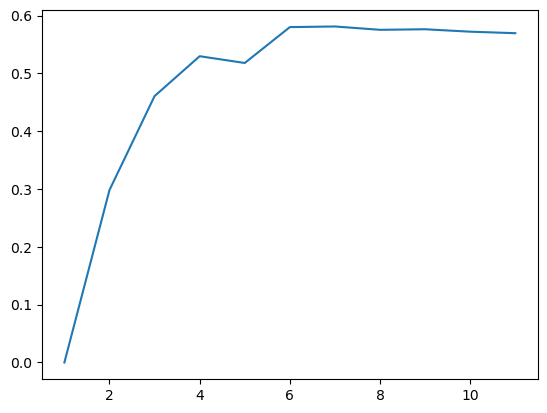

In [19]:
np.random.seed(15)
mods = []
ks = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
for k in ks:
    clusters = spect_cluster(G, k=k) ### NOTE: If you do not use your implementation substitute with a call to the sklearn one. 
    mods.append(modularity(G, clusters))

# You may want to use plt.plot to plot the modularity for different values of k
plt.plot(ks, mods)
print(mods)

******************
<span style="color:red">**YOUR ANSWER HERE**</span>
******************

By observing the above graph, we are seeing that $K=6$ maximize the modularity. The ground truth has **6 communities,** the result is consistent. **Spectral clustering** successfully identifies the true structure, and modularity correctly rewards this partitioning.

### Task 2.2.6 (2 points)

<span style='color: green'>**\[Motivate\]**</span> There seems to be a relationship between graph embeddings and spectral clustering, can you guess that? _Hint_: Think to the eigenvectors of the graph's Laplacians.

* [x] If the embeddings are linear and the similarity is the Laplacian, the embeddings we obtain minimizing the $L_2$ norm are equivalent to the eigenvectors of the Laplacian. 
* [ ] If the embeddings are random-walk-based embeddings, the eigenvectors of the Random Walk Laplacian are related to the embeddings obtained by such methods. 
* [ ] The relationship is just apparent. 
* [ ] If the embeddings are linear and the similarity is the Adjacency matrix, the eigenvectors of the Laplacian are equivalent to the embeddings. 

******************
<span style="color:red">**YOUR ANSWER HERE**</span>
******************

**Spectral Clustering** directly uses the eigenvectors of the Laplacian matrix (e.g., $L_{norm}$ or $L_{rw}$) as node embeddings. The embeddings derived from these eigenvectors linearly separate communities in the graph, enabling k-means clustering. Thus, there is a fundamental relationship: if our embedding method is linear and based on the graph Laplacian, then the embeddings are exactly the eigenvectors of that Laplacian.

# Part 3: Link analysis

<span style="color:red">In the following sections we will be using **Cora** dataset. Below you can find a brief description of the dataset. More detailed info can be found in [./data/cora/README](./data/cora/README).</span> 

The **Cora dataset** is a collection of **Machine Learning papers** categorized into **seven classes**: Case-Based, Genetic Algorithms, Neural Networks, Probabilistic Methods, Reinforcement Learning, Rule Learning, and Theory. It contains **2708 papers**, where each paper cites or is cited by at least one other paper, forming a citation graph.

The dataset includes:
- **content file**: Paper descriptions with binary word attributes (presence or absence of 1433 unique words) and class labels.
- **cites file**: Citation relationships between papers, indicating which paper cites another.
- **papers file**: List of postscript files with IDs, filenames, and citation strings.

## Task 3.1 Cora dataset and PageRank (7 points)

The code below will be useful when working on exercises in the following sections.

In [20]:
content = pd.read_csv('data/cora/cora.content', sep='\t',
                  header=None,
                  usecols=[0, 1434],
                  names=['node_id', 'label'],
                  dtype={'node_id': str, 'label': 'category'},
                  index_col='node_id')

content['label_code'] = content['label'].cat.codes
content.head(5)

,label,label_code
node_id,,
31336,Neural_Networks,2
1061127,Rule_Learning,5
1106406,Reinforcement_Learning,4
13195,Reinforcement_Learning,4
37879,Probabilistic_Methods,3


In [21]:
papers = pd.read_csv('data/cora/cora.papers', sep='\t',
                  header=None,
                  names=['node_id', 'filename', 'citation'],
                  dtype={'node_id': str},
                  index_col='node_id')

papers.head(5)

,filename,citation
node_id,,
2,http:##dimacs.rutgers.edu#techps#1994#94-07.ps,"[Gar] <author> M.R. Garey & D.S. Johnson, </au..."
16,http:##www.cs.wisc.edu#~fischer#ftp#pub#tech-r...,"[DeWitt90] <author> D. DeWitt, P. Futtersack, ..."
18,ftp:##ftp.cs.purdue.edu#pub#hosking#papers#oop...,"[Hoski93a] <author> A. Hosking, J. E. B. Moss,..."
18,ftp:##ftp.cs.umass.edu#pub#osl#papers#oopsla93...,"[Hoski93a] <author> A. Hosking, J. E. B. Moss,..."
18,http:##cobar.cs.umass.edu#pubfiles#ds7.ps.gz,"[Hoski93a] <author> A. Hosking, J. E. B. Moss,..."


To get a better feeling of how the dataset looks like, you can run the code below to plot the graph with ground truth labelings.

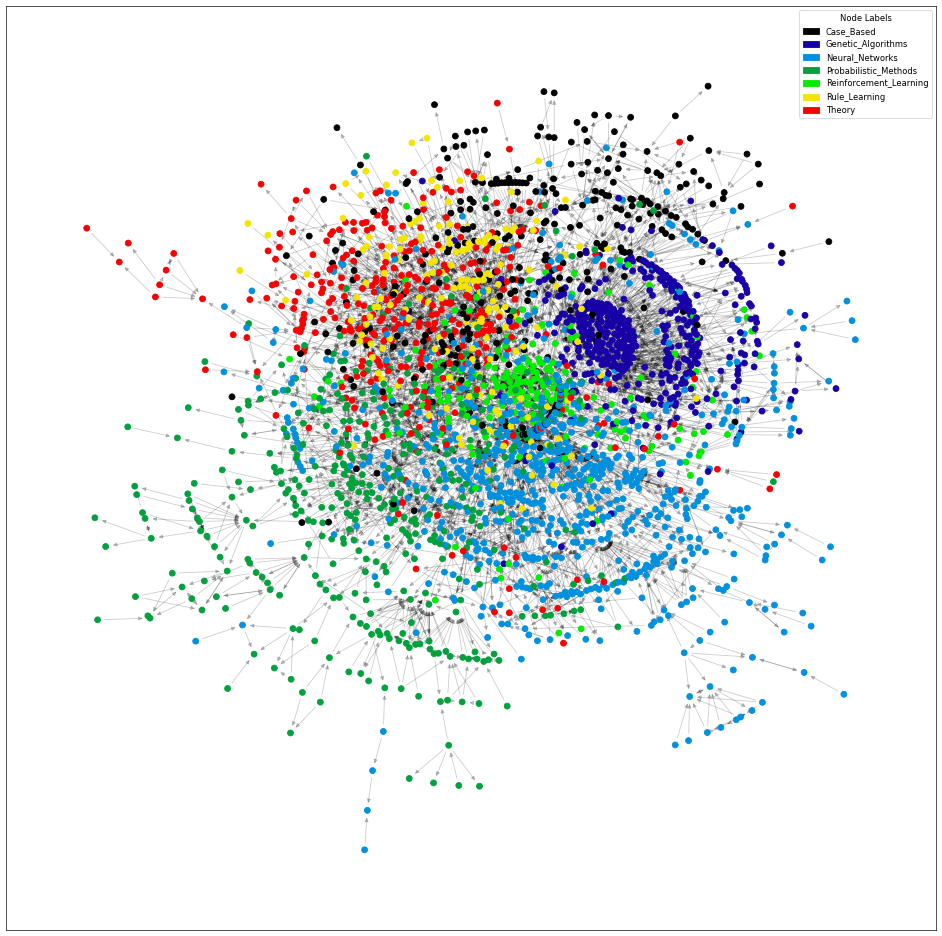

In [22]:
G: nx.DiGraph = nx.read_edgelist("data/cora/cora.cites", create_using=nx.DiGraph()).reverse()
plt.figure(1, figsize=(20, 20), dpi=60)
with open('data/cora/cora.layout.pkl', 'rb') as f:
    layout = pickle.load(f)
labels = content['label_code'].loc[list(G.nodes)].to_numpy()
unique_labels = content['label'].cat.categories
colors = plt.cm.nipy_spectral(np.linspace(0, 1, len(unique_labels), endpoint=False))
color_map = dict(zip(unique_labels, colors))
node_colors = [color_map[content.loc[node]['label']] for node in G.nodes]
nx.draw_networkx_nodes(G, layout, node_color=node_colors, node_size=50)
nx.draw_networkx_edges(G, layout, alpha = 0.2)

handles = [mpatches.Patch(color=color_map[label], label=label) for label in unique_labels]
plt.legend(handles=handles, loc='best', title='Node Labels')
plt.show()

### Task 3.1.1 (2 points)

<span style='color: green'>**\[Implement\]**</span> From the [MMD] book we know that

*"PageRank is a function that assigns a real number to each page in the Web [...] The intent is that the higher the PageRank of a page, the more
“important” it is."*.

Put yourself in the shoes of an eager Machine Learning student mostly interested in "Reinforcement_Learning" who wants to find the most important papers to read. Run **Topic-specific** PageRank on the graph induced by the Cora dataset. Find the top 10 papers with the highest PageRank.

<span style='color: red'>For this task, use `nx.pagerank` which uses the Power Iteration method.</span>


In [23]:
# Construct directed graph
G_: nx.DiGraph = nx.read_edgelist("data/cora/cora.cites", create_using=nx.DiGraph()).reverse()

### YOUR CODE HERE
paper_topics = {}
with open("data/cora/cora.content", 'r') as f:
    for line in f:
        parts = line.strip().split('\t')
        if len(parts) > 1:
            paper_id = parts[0]
            topic = parts[-1]  # The last column contains the topic
            paper_topics[paper_id] = topic

personalization = {}
for node in G_.nodes():
    if node in paper_topics and paper_topics[node] == "Reinforcement_Learning":
        personalization[node] = 1.0
    else:
        personalization[node] = 0.0

pagerank_scores = nx.pagerank(G_, alpha=0.85, personalization=personalization)

# Filter for only Reinforcement_Learning papers
rl_papers = {paper: score for paper, score in pagerank_scores.items() 
             if paper in paper_topics and paper_topics[paper] == "Reinforcement_Learning"}

top_10_papers = sorted(rl_papers.items(), key=lambda x: x[1], reverse=True)[:10]

results_df = pd.DataFrame({
    "Rank": range(1, 11),
    "Paper_ID": [paper_id for paper_id, _ in top_10_papers],
    "PageRank_Score": [score for _, score in top_10_papers]
})
print(results_df)
### YOUR CODE HERE

   Rank Paper_ID  PageRank_Score
0     1     6213        0.065038
1     2     4584        0.044399
2     3      114        0.031958
3     4     6151        0.026777
4     5     6214        0.016437
5     6      117        0.013543
6     7    28350        0.009518
7     8     6209        0.008155
8     9    35863        0.007156
9    10    28227        0.007123


### Task 3.1.2 (3 points)

<span style='color: green'>**\[Motivate\]**</span> An important observation about the graph induced by the Cora dataset is that, at least in theory, it should be acyclic. Can you see why?

Consider the PageRank-related problems discussed in one of the lectures, such as "sink nodes," "spider traps," and "link farms." Do these problems exist in acyclic graphs? Motivate your answer.

If **YES**, are these problems amplified or diminished?



******************
<span style="color:red">**YOUR ANSWER HERE**</span> <br>
******************

The **Cora dataset,** a citation network, is naturally acyclic because each paper can only cite papers that were published before it.

**Problems of PageRank:**
- **Sink nodes** (nodes with no outgoing edges) can appear (typically among the oldest papers), but these are addressed by the teleportation step in the PageRank algorithm.
- **Spider traps** and **link farms** require cycles to trap or artificially boost rank. Since an acyclic graph does not allow cycles, these problems are effectively diminished or eliminated.

### Task 3.1.3 (2 points)
Run the same experiment as in task 3.1.1, but this time on the undirected version of the graph.

<span style='color: green'>**\[Motivate\]**</span> which experiment do you think finds more important papers? Explain why you think so.


In [24]:
# Construct undirected graph
G: nx.Graph = nx.read_edgelist("data/cora/cora.cites", create_using=nx.Graph())

### YOUR CODE HERE
paper_topics = {}
with open("data/cora/cora.content", 'r') as f:
    for line in f:
        parts = line.strip().split('\t')
        if len(parts) > 1:
            paper_id = parts[0]
            topic = parts[-1]  
            paper_topics[paper_id] = topic

personalization = {}
for node in G.nodes():
    if node in paper_topics and paper_topics[node] == "Reinforcement_Learning":
        personalization[node] = 1.0
    else:
        personalization[node] = 0.0

pagerank_scores = nx.pagerank(G, alpha=0.85, personalization=personalization)
rl_papers = {paper: score for paper, score in pagerank_scores.items() 
             if paper in paper_topics and paper_topics[paper] == "Reinforcement_Learning"}

top_10_papers = sorted(rl_papers.items(), key=lambda x: x[1], reverse=True)[:10]

results_df = pd.DataFrame({
    "Rank": range(1, 11),
    "Paper_ID": [paper_id for paper_id, _ in top_10_papers],
    "PageRank_Score": [score for _, score in top_10_papers]
})
print(results_df)

   Rank Paper_ID  PageRank_Score
0     1     6213        0.038605
1     2      114        0.023091
2     3     6214        0.014355
3     4     4584        0.012967
4     5      117        0.008908
5     6    28350        0.008705
6     7    17476        0.006614
7     8     6163        0.006383
8     9     6209        0.006302
9    10     7419        0.006116


******************
<span style="color:red">**YOUR ANSWER HERE**</span> <br>
******************

The **directed** graph finds more meaningful papers because it depends on the citation direction, reflecting real academic influence. For example, a paper is important if others cite it. In contrast, the undirected version treats citations as mutual relationships, which may not consider important in academia because it does not “cite back”.

## Task 3.2 Approximate PageRank (10 points)

### Task 3.2.1 (4 points)

<span style='color: green'>**\[Implement\]**</span>  a different algorithm for computing Personalized PageRank. This algorithm runs a fixed number of iterations and uses the definition of random walks. 
At each step, the algorithm either selects a random neighbor with probability $\alpha$ or returns to the starting node with probability $1-\alpha$. Every time a node is visited a counter on the node is incremented by one. Initially, each counter is 0. The final ppr value is the values in the nodes divided by the number of iterations. 

In [25]:
import random

def approx_personalized_pagerank(G: nx.Graph, node, alpha = 0.85, iterations = 1000):
    """
    Compute the approximate personalized PageRank for a given node in a graph using random walks.

    Parameters:
    G (networkx.Graph): The input graph.
    node (int or str): The starting node for the random walks.
    alpha (float): The probability of continuing the random walk to a neighbor.
    iterations (int): The number of steps to perform.

    Returns:
    dict: A dictionary where keys are nodes and values are the approximate personalized PageRank values.
    """
    ppr = dict(zip(G.nodes, np.zeros(len(G.nodes))))
    ### YOUR CODE HERE
    current = node
    for _ in range(iterations):
        if random.random() < alpha:
            neighbors = list(G.neighbors(current))
            if neighbors: 
                current = random.choice(neighbors)
            else:
                current = node
        else:
            current = node
        ppr[current] += 1
    for key in ppr:
        ppr[key] /= iterations
    ### YOUR CODE HERE
    return ppr

### Task 3.2.2 (4 points)

Run the ```approx_personalized_pagerank``` with default $\alpha$ and iterations $\{10, n, 2n, 10n, 100n, 1000n\}$ where $n$ is the number of nodes in the graph and starting node the node with the highest PageRank. Compare it to the PageRank obtained by running ```nx.pagerank(G, alpha=0.85, personalization={node_highest_pagerank: 1})```.

In [26]:
G: nx.Graph = nx.read_edgelist("data/cora/cora.cites", create_using=nx.Graph())
n = G.number_of_nodes()

### YOUR CODE HERE
pr_full = nx.pagerank(G, alpha=0.85)
node_highest_pagerank = max(pr_full, key=pr_full.get)
print("Node with highest PageRank:", node_highest_pagerank)

pers_pr = nx.pagerank(G, alpha=0.85, personalization={node_highest_pagerank: 1})
print("\nTop 10 nodes from nx.pagerank (personalization):")
top10 = sorted(pers_pr.items(), key=lambda x: x[1], reverse=True)[:10]
for rank, (node, score) in enumerate(top10, start=1):
    print(f"{rank:2d}. Node: {node:<10s} | Score: {score:.5f}")

iteration_values = [10, n, 2*n, 10*n, 100*n, 1000*n]
approx_diffs = []

print("\nApproximate Personalized PageRank Convergence:")
for iters in iteration_values:
    approx_pr = approx_personalized_pagerank(G, node_highest_pagerank, alpha=0.85, iterations=iters)
    # difference between the approximate and the exact personalized PageRank.
    diff = sum(abs(approx_pr[node] - pers_pr[node]) for node in G.nodes() if node in approx_pr and node in pers_pr)
    approx_diffs.append(diff)
    print(f"Iterations: {iters:8d} | L1 Difference: {diff:.5f}")

    approx_top10 = sorted(approx_pr.items(), key=lambda x: x[1], reverse=True)[:10]
    print("Approximate Top 10 Nodes:")
    for rank, (node, score) in enumerate(approx_top10, start=1):
         print(f"  {rank:2d}. Node: {node:<10s} | Score: {score:.5f}")
### YOUR CODE HERE

Node with highest PageRank: 35

Top 10 nodes from nx.pagerank (personalization):
 1. Node: 35         | Score: 0.23303
 2. Node: 82920      | Score: 0.01080
 3. Node: 85352      | Score: 0.00930
 4. Node: 1688       | Score: 0.00913
 5. Node: 287787     | Score: 0.00731
 6. Node: 210871     | Score: 0.00568
 7. Node: 12576      | Score: 0.00545
 8. Node: 54131      | Score: 0.00484
 9. Node: 14062      | Score: 0.00484
10. Node: 33907      | Score: 0.00481

Approximate Personalized PageRank Convergence:
Iterations:       10 | L1 Difference: 1.57469
Approximate Top 10 Nodes:
   1. Node: 35         | Score: 0.20000
   2. Node: 103515     | Score: 0.20000
   3. Node: 576725     | Score: 0.20000
   4. Node: 576795     | Score: 0.20000
   5. Node: 1128314    | Score: 0.10000
   6. Node: 1128201    | Score: 0.10000
   7. Node: 1033       | Score: 0.00000
   8. Node: 103482     | Score: 0.00000
   9. Node: 1050679    | Score: 0.00000
  10. Node: 1103960    | Score: 0.00000
Iterations:     270

A). <span style='color: green'>**\[Motivate\]**</span>  Why are the values and the top-10 nodes ranked by Approximate PPR changing so much? 

******************
<span style="color:red">**YOUR ANSWER HERE**</span>  

******************

The values and the top-10 nodes ranked by **Approximate Personalized PageRank (PPR)** change a lot because the algorithm is randomized and relies on a small number of samples when iterations are low. With fewer iterations, the random walks do not explore much of the graph, so the rankings are based on incomplete and noisy information. This causes high variability in both the values and the top-ranked nodes.

B). <span style='color: green'>**\[Motivate\]**</span> What do you notice as the number of iterations increase? Is there a relationship between the number of iterations and the results? Is there a relationship between the approximated value of PageRank and the real value?

*****************
<span style="color:red">**YOUR ANSWER HERE**</span>  

*****************

As the number of iterations increases, the Approximate PPR becomes more stable and accurate. So yes, there is a clear relationship. Yes, the approximated values converge to the real PageRank values over time.

This happens because more iterations mean more random walks, which sample the graph more thoroughly and reduce randomness. Eventually, Approximate PPR becomes a good estimate of the true Personalized PageRank.

### Task 3.2.3 (2 points)

Run again the same experiment as in task 3.2.2 but this time use $\alpha = 0.1$. 

<span style='color: green'>**\[Motivate\]**</span> Motivate whether and why you need more or less iterations to predict the 10 nodes with the highest PPR.

In [27]:
print("\nApproximate Personalized PageRank Convergence:")
for iters in iteration_values:
    approx_pr = approx_personalized_pagerank(G, node_highest_pagerank, alpha=0.1, iterations=iters)
    # difference between the approximate and the exact personalized PageRank.
    diff = sum(abs(approx_pr[node] - pers_pr[node]) for node in G.nodes() if node in approx_pr and node in pers_pr)
    approx_diffs.append(diff)
    print(f"Iterations: {iters:8d} | L1 Difference: {diff:.5f}")

    approx_top10 = sorted(approx_pr.items(), key=lambda x: x[1], reverse=True)[:10]
    print("Approximate Top 10 Nodes:")
    for rank, (node, score) in enumerate(approx_top10, start=1):
         print(f"  {rank:2d}. Node: {node:<10s} | Score: {score:.5f}")
### YOUR CODE HERE


Approximate Personalized PageRank Convergence:
Iterations:       10 | L1 Difference: 1.52850
Approximate Top 10 Nodes:
   1. Node: 35         | Score: 0.90000
   2. Node: 86359      | Score: 0.10000
   3. Node: 1033       | Score: 0.00000
   4. Node: 103482     | Score: 0.00000
   5. Node: 103515     | Score: 0.00000
   6. Node: 1050679    | Score: 0.00000
   7. Node: 1103960    | Score: 0.00000
   8. Node: 1103985    | Score: 0.00000
   9. Node: 1109199    | Score: 0.00000
  10. Node: 1112911    | Score: 0.00000
Iterations:     2708 | L1 Difference: 1.32443
Approximate Top 10 Nodes:
   1. Node: 35         | Score: 0.89439
   2. Node: 190697     | Score: 0.00222
   3. Node: 1128204    | Score: 0.00185
   4. Node: 592973     | Score: 0.00185
   5. Node: 66805      | Score: 0.00185
   6. Node: 28851      | Score: 0.00148
   7. Node: 33904      | Score: 0.00148
   8. Node: 48766      | Score: 0.00148
   9. Node: 594543     | Score: 0.00148
  10. Node: 69296      | Score: 0.00148
Iteratio

*****************
<span style="color:red">**YOUR ANSWER HERE**</span>  

*****************

With $\alpha = 0.1$, we need fewer iterations to predict because the high teleportation rate forces rapid convergence to a distribution concentrated around the starting node. This is in contrast to a higher $\alpha = 0.85$ where the walker explores more of the graph, requiring more iterations for the distribution to stabilize.

However, we need more iterations to accurately predict the top 10 nodes with the highest PPR because Personalized PageRank is based on probabilistic random walks. With a low number of iterations, the walks might not explore enough of the graph, especially distant but important nodes. This causes noise and fluctuations in the estimated values, leading to incorrect rankings.

## Task 3.3 Spam and link farms (6 points)

While the Cora dataset is theoretically expected to be acyclic, this is not always the case in practice. Two papers may cite each other (e.g., preprints or conference versions), forming a cycle that artificially boosts their PageRank. Although a single cycle has a minor impact on PageRank, the effect accumulates when a node is part of many cycles. From the lectures, you should know that this type of structure is called a *link farm*.

The goal of this exercise is to identify link farms in Cora graph.

### Task 3.3.1 (3 points)
A). <span style='color: green'>**\[Implement\]**</span> <br> 
Compute spam mass of each node.

***[Hint]** One way to interpret spam mass is as the deviation of TrustRank from PageRank. For more info check lecture notes.* <br>
***[Note]** To compute PageRank you can use `nx.pagerank`.*

In [28]:
# Directed graph where an edge points from the paper which contains the citation to the paper being cited
G: nx.DiGraph = nx.read_edgelist("data/cora/cora.cites", create_using=nx.DiGraph()).reverse()

### YOUR CODE HERE
pr = nx.pagerank(G, alpha=0.85)
num_trusted = int(len(G.nodes()) * 0.1)
trusted_nodes = sorted(pr, key=pr.get, reverse=True)[:num_trusted]

personalization = {node: 0 for node in G.nodes()}
for node in trusted_nodes:
    personalization[node] = 1.0 / num_trusted

with open('data/cora/cora.layout.pkl', 'rb') as f:
    layout = pickle.load(f)

ordered_nodes = list(layout.keys())
trust_rank = nx.pagerank(G, alpha=0.85, personalization=personalization)
spam_mass = np.empty(len(ordered_nodes))
for i, node in enumerate(ordered_nodes):
    if pr[node] > 0:
        spam_mass[i] = max(0, 1 - trust_rank[node]/ pr[node]) 
    else:
        spam_mass[i] = 0

top10_indices = sorted(range(len(ordered_nodes)), key=lambda i: spam_mass[i], reverse=True)[:10]
print("Top 10 nodes by spam mass:")
for rank, idx in enumerate(top10_indices, start=1):
    node = ordered_nodes[idx]
    print(f"{rank:2d}. Node: {str(node):<10s} | Spam Mass: {spam_mass[idx]:.5f}")
### YOUR CODE HERE

Top 10 nodes by spam mass:
 1. Node: 1033       | Spam Mass: 1.00000
 2. Node: 103482     | Spam Mass: 1.00000
 3. Node: 1050679    | Spam Mass: 1.00000
 4. Node: 1103960    | Spam Mass: 1.00000
 5. Node: 1103985    | Spam Mass: 1.00000
 6. Node: 1109199    | Spam Mass: 1.00000
 7. Node: 1112911    | Spam Mass: 1.00000
 8. Node: 1113438    | Spam Mass: 1.00000
 9. Node: 1113831    | Spam Mass: 1.00000
10. Node: 1114331    | Spam Mass: 1.00000


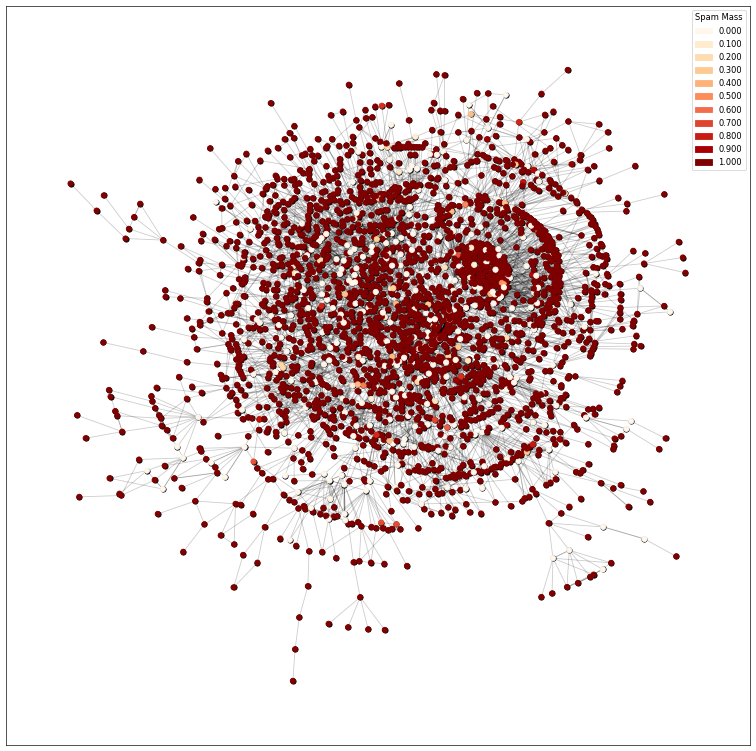

In [29]:
# Run the code below to visualize how the spam mass computed by you is distributed across the graph
c_map = plt.cm.OrRd
plt.figure(4, figsize=(16, 16), dpi=60)
with open('data/cora/cora.layout.pkl', 'rb') as f:
    layout = pickle.load(f)
nx.draw_networkx_edges(G, layout, alpha = 0.2, arrows=False) # arrows=False to speed up plotting
nx.draw_networkx_nodes(G, layout, node_color="black", node_size=40)
nx.draw_networkx_nodes(G, layout, node_color=spam_mass, node_size=40, cmap=c_map)
rg = spam_mass.max() - spam_mass.min()
handles = [mpatches.Patch(color=c_map(i/10), label=f'{ (spam_mass.min() +  rg*i/10):.3f}') for i in range(11)]
plt.legend(handles=handles, loc='best', title='Spam Mass')
plt.show()

B). <span style='color: green'>**\[Motivate\]**</span> <br>
Explain how you compute spam mass. How to interpret the values. Why does your method even work.

*****************
<span style="color:red">**YOUR ANSWER HERE**</span>  

*****************

**Our steps to compute Spam mass:**
- First, we have computed the standard PageRank of every node in the graph.
- Next, we have computed TrustRank by biasing the PageRank algorithm with a personalization vector that assigns all the teleportation probability to a trusted set of nodes (in our case, the top 10% of nodes by PageRank).
- Then for spam mass we have computed ->
$$spam\_mass = max (0, 1 - \frac{PageRank_{(i)} - TrustRank_{(i)}} {PageRank_{(i)}})$$

There are several method to calculate the spam mass but we have chosen above one to omit negative values. 

**Low spam mass** indicates that the node’s importance as measured by PageRank is well supported by the trusted portion of the network. These nodes are likely genuine and not part of a spam structure whereas **High spam mass** indicates that the node’s PageRank is high, but its TrustRank is relatively low.

This method works because spam nodes often link heavily among themselves to inflate their rank. When we compute PageRank based only on trusted nodes, spam nodes lose a lot of rank. The difference between global rank and trusted-rank shows how much of their influence is artificial.


### Task 3.3.2 (3 points)
A). <span style='color: green'>**\[Motivate\]**</span> <br> 
Based on the values of spam mass you computed, choose threshold value that separates spam nodes from non-spam nodes. Motivate your choice of the threshold value.

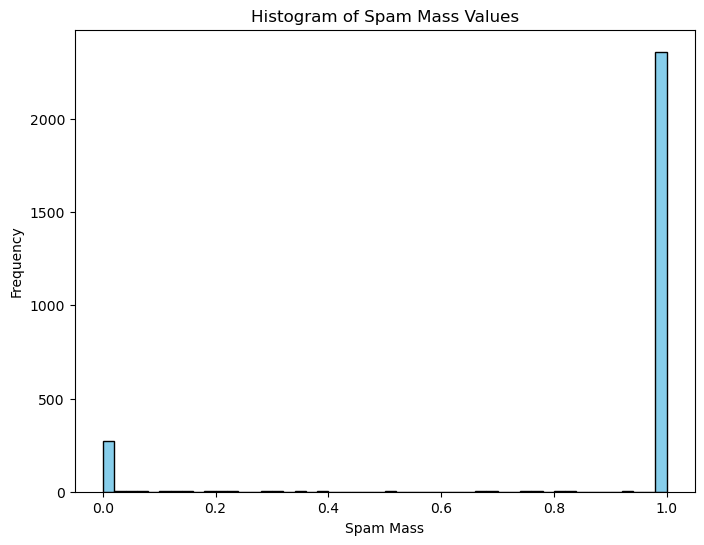

In [30]:
### YOUR CODE HERE IF NEEDED
### you might want to plot something
plt.figure(figsize=(8, 6))
plt.hist(spam_mass, bins=50, color='skyblue', edgecolor='black')
plt.xlabel('Spam Mass')
plt.ylabel('Frequency')
plt.title('Histogram of Spam Mass Values')
plt.show()

*****************
<span style="color:red">**YOUR ANSWER HERE**</span>  

*****************

The histogram shows that most nodes lie at either 0 or 1, with minimal mass in between. This gap implies a natural “split” in the data. We have chosen 0.6 as a threshold that means at least half of the node’s PageRank cannot be explained by its TrustRank.  

B). <span style='color: green'>**\[Implement\]**</span> <br> 
Based on the threshold value find spam nodes. Print them.

In [31]:
### YOUR CODE HERE
threshold = 0.6
spam_nodes = [node for node, mass in zip(ordered_nodes, spam_mass) if mass > threshold]
nonspam_nodes = [node for node, mass in zip(ordered_nodes, spam_mass) if mass <= threshold]

print(f"Number of spam nodes (spam mass > {threshold}): {len(spam_nodes)}")
print(f"Number of non-spam nodes (spam mass <= {threshold}): {len(nonspam_nodes)}")

print("Spam Nodes (spam mass > 0.6):")
for node in spam_nodes:
    print(node)
### YOUR CODE HERE

Number of spam nodes (spam mass > 0.6): 2384
Number of non-spam nodes (spam mass <= 0.6): 324
Spam Nodes (spam mass > 0.6):
1033
103482
1050679
1103960
1103985
1109199
1112911
1113438
1113831
1114331
1117476
1119505
1119708
1120431
1123756
1125386
1127430
1127913
1128204
1128227
1128314
1128453
1128945
1128959
1128985
1129018
1129027
1129573
1129683
1129778
1130847
1130856
1131116
1131360
1131557
1131752
1133196
1133338
1136814
1137466
1152421
1152508
1153065
1153280
1153577
1153853
1153943
1154176
1154459
116552
128540
132806
135130
141347
148170
15670
175291
178727
18582
190697
190706
197054
198443
206371
229635
231249
248425
249421
259701
259702
263279
263498
265203
27510
28290
286500
289779
289780
289781
307015
335733
33904
33907
387795
415693
44368
45599
46079
46431
486840
48766
503883
503893
513189
56119
561238
568857
573964
573978
574009
574462
575292
575331
576725
576795
577227
578780
579008
592973
593091
593105
593240
593260
593813
594047
594543
594649
594900
608326
634902
634

C). <span style='color: green'>**\[Motivate\]**</span> <br> 
The code below plots the spam nodes identified by you and the citation cycles present in the graph.

Analyze the plot. Is there a relationship between position of spam nodes and citation cycles?

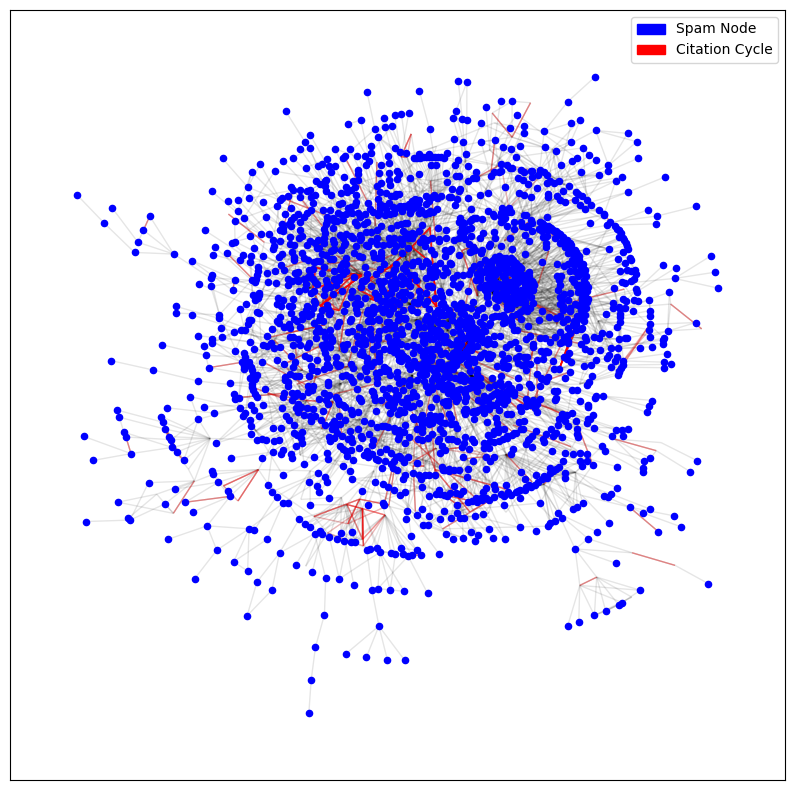

In [32]:
# Plot spam nodes and citation cycles

plt.figure(figsize=(10, 10))
with open('data/cora/cora.layout.pkl', 'rb') as f:
    pos = pickle.load(f)
nx.draw_networkx_edges(G, pos, alpha = 0.1, arrows=False)

# draw cycles
cycles = [cycle for cycle in nx.simple_cycles(G)]
for cycle in cycles:
    cycle_edges = list(zip(cycle, cycle[1:] + [cycle[0]]))
    nx.draw_networkx_edges(G, pos, edgelist=cycle_edges, edge_color='red', alpha=0.2, arrows=False)

# draw spam nodes
nx.draw_networkx_nodes(G, pos, nodelist=spam_nodes, node_color="blue", node_size=20)

blue_patch = mpatches.Patch(color='blue', label='Spam Node')
red_patch = mpatches.Patch(color='red', label='Citation Cycle')
plt.legend(handles=[blue_patch, red_patch])

plt.show()

*****************
<span style="color:red">**YOUR ANSWER HERE**</span>  

*****************

The plot shows the spam nodes in blue and citation cycles in red. By analyzing the visualization, we can observe that many spam nodes tend to cluster around citation cycles. This suggests a strong relationship: spam nodes often participate in or exploit cycles to artificially boost their PageRank. Citation cycles help circulate rank within a closed group, and spammers use this tactic (similar to link farming) to increase influence. So yes, there is a clear pattern spam nodes are frequently located near or inside citation cycles, indicating that these cycles may be a structural feature of spam behavior in the graph.

# Part 4: Graph embeddings

In this section we will be using Cora dataset. Basic information about the dataset can be found at the beginning of [section 3](#part-3-link-analysis).

The goal is, given the set of papers and all information we have about them, we want to find groups of similar papers. We know ground truth labeling of the papers, we will use it to measure the performance of our methods.

In [33]:
# The graph of papers
G: nx.Graph = nx.read_edgelist("data/cora/cora.cites", create_using=nx.Graph())

In [34]:
# The information we have about the papers, including ground truth labeling
content = pd.read_csv('data/cora/cora.content', sep='\t', header=None, dtype={0: str, 1434: 'category'})

content.rename(columns={0: 'node_id'}, inplace=True)
content.rename(columns={1434: 'label'}, inplace=True)
content['label_code'] = content['label'].cat.codes
content.set_index('node_id', inplace=True)

content.head(5)


,1,2,3,4,5,6,7,8,9,10,...,1426,1427,1428,1429,1430,1431,1432,1433,label,label_code
node_id,,,,,,,,,,,,,,,,,,,,,
31336,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,Neural_Networks,2
1061127,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,Rule_Learning,5
1106406,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Reinforcement_Learning,4
13195,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Reinforcement_Learning,4
37879,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Probabilistic_Methods,3


***[Hint]**<br>
To get adjacency matrix use `nx.to_numpy_array(G)` <br>
To get vector of labels use `content['label_code'].loc[list(G.nodes)].to_numpy()` <br>
To get matrix of word attributes use `content[range(1, 1434)].loc[list(G.nodes)].to_numpy()`*

## Task 4.1 (13 points)

In this part, the strategy is going to be the following:

1. Use VERSE [[1]](https://arxiv.org/pdf/1803.04742.pdf) to produce embeddings of the nodes in the graph.
2. Use K-Means to cluster the embeddings. Measure and report NMI for the clustering. 

[[1](https://arxiv.org/pdf/1803.04742.pdf)] Tsitsulin, A., Mottin, D., Karras, P. and Müller, E., 2018, April. Verse: Versatile graph embeddings from similarity measures. In Proceedings of the 2018 World Wide Web Conference (pp. 539-548).

### Task 4.1.1 (6 points)

<span style='color: green'>**\[Implement\]**</span> the methods below to compute sampling version of VERSE. 

_Hint1:_ it might be a help to look in the original article \[1\] above.

_Hint2:_ Line 14-15 in the pseudo code from the paper contains a typo:<br>
 Line 14 should be $W_u \leftarrow W_u+(g*W_v)$

 Line 15 should be $W_v \leftarrow W_v+(g*W_u)$

In [35]:
from tqdm import tqdm
from typing import Union

def sigmoid(x):
    ''' Return the sigmoid function of x 
        x: the input vector
    '''
    ### YOUR CODE HERE
    x = 1 / (1 + np.exp(-x))
    ### YOUR CODE HERE
    return x

def pagerank_matrix(G: Union[nx.Graph, nx.DiGraph], alpha = 0.85) :
    ''' Return the Personalized PageRank matrix of a graph.
        You can find the formula in the lecture slides.

        Args:
            G: the input graph
            alpha: the damping factor of PageRank

        :return The nxn PageRank matrix P
    '''
    ### YOUR CODE HERE
    n = G.number_of_nodes()
    A = nx.to_numpy_array(G) 
    # Compute degree vector; avoid division by zero by replacing zeros with 1.
    d = A.sum(axis=1)
    d = np.where(d == 0, 1, d)
    D_inv = np.diag(1/d)
    M = D_inv @ A
    I = np.eye(n)
    P = (1 - alpha) * np.linalg.inv(I - alpha * M)
    ### YOUR CODE HERE
    assert np.allclose(P.sum(axis=1), 1), "Output rows should sum up to 1"
    assert np.all(P >= 0), "All elements of P should be non-negative"
    return P
    

def update(u, v, Z, C, step_size) :
    '''Update the matrix Z using row-wise gradients of the loss function

       Args:
            u : the first node
            v : the second node
            Z : the embedding matrix
            C : the classification variable used in Noise Contrastive estimation indicating whether the sample is positive or negative
            step_size: step size for gradient descent


       :return nothing, just update rows Z[v,:] and and Z[u,:]
    '''
    ### YOUR CODE HERE
    dot = np.dot(Z[u], Z[v])
    g = sigmoid(dot)
    if C == 1:
        g = 1 - g
    else:
        g = -g
    # Use temporary copies to update simultaneously.
    temp_u = Z[u].copy()
    temp_v = Z[v].copy()
    Z[u] += step_size * g * temp_v
    Z[v] += step_size * g * temp_u
    ### YOUR CODE HERE
    
    
def verse(G, S, d, k = 3, step_size = 0.05, steps = 100_000): 
    ''' Return the sampled version of VERSE

        Args:
            G: the input Graph
            S: the PageRank similarity matrix
            d: dimension of the embedding space
            k: number of negative samples
            step_size: step size for gradient descent
            steps: number of iterations

        :return the embedding matrix nxd
    '''
    n = G.number_of_nodes()
    Z = 1/d*np.random.rand(n,d)

    ### YOUR CODE HERE
    nodes = np.arange(n)
    for _ in tqdm(range(steps)):
        u = np.random.choice(nodes)
        v = np.random.choice(nodes, p=S[u])
        update(u, v, Z, 1, step_size)
        for _ in range(k):
            v_neg = np.random.choice(nodes)
            update(u, v_neg, Z, 0, step_size)
    ### YOUR CODE HERE
    return Z

In [36]:
# This code runs the `verse` algorithm above on G. You might want to change `step_size` and `steps` 
#P   = pagerank_matrix(G)
#emb = verse(G, P, 8, step_size=0.05, steps=1_000_000)

In [37]:
# You can save the embeddings to a local file using the below
#np.save('verse.npy', emb)

# # Similarly, you can load them back using
emb = np.load('verse.npy')

### Task 4.1.2 (3 points)

<span style='color: green'>**\[Implement\]**</span> a small piece of code that runs K-means on the embeddings with $k \in [2,10]$ to evaluate the performance compared to Spectral clustering from section 2 using the NMI as measure. You can use ```sklearn.metrics.normalized_mutual_info_score``` for the NMI and ```sklearn.cluster.KMeans``` for kmeans. In both cases, you can use your own implementation from Handin 1 or the exercises, but it will not give you extra points.  

<span style='color: green'>**\[Motivate\]**</span> which of the method performs the best and whether the results show similarities between the two methods

*[Note] You might need to tweak parameters of VERSE and Spectral Clustering to get meaningful results.*

kmeans 2 - SpecClust 2: 0.0006308136842085463
kmeans 2 - SpecClust 10: 0.010957038820173598
kmeans 10 - SpecClust 2: 0.0016065851685817627
kmeans 10 - SpecClust 10: 0.029551480196873574


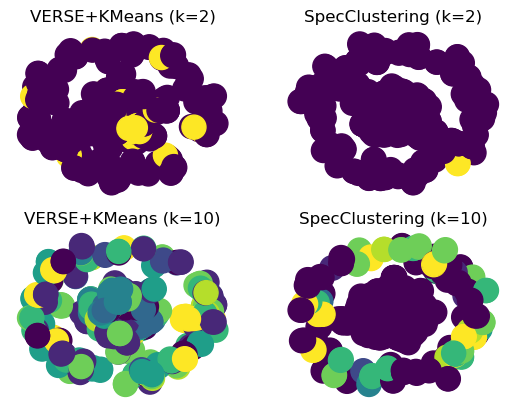

In [40]:
### YOUR CODE HERE
from sklearn.cluster import KMeans
from sklearn.metrics.cluster import normalized_mutual_info_score

### YOUR CODE HERE
cl = [2,10]
labels_kmeans = {}
for k in cl:
    kmeans = KMeans(n_clusters=k).fit(emb)
    labels_kmeans.update({k:kmeans.labels_})
labels_spec = {}
for k in cl:
    specClust = spect_cluster(G, k=k)
    labels_spec.update({k:specClust})

for k, v in labels_kmeans.items():
    for k_2, v_2 in labels_spec.items():
        print(f"kmeans {k} - SpecClust {k_2}: {normalized_mutual_info_score(v,v_2)}")

fig, all_axes = plt.subplots(2,2)
ax = all_axes.flat
for i, c in enumerate(cl):
    ax[i*2].title.set_text(f"VERSE+KMeans (k={c})")
    nx.draw(G, with_labels=False, ax=ax[i*2], node_color=labels_kmeans[c])
    ax[i*2+1].title.set_text(f"SpecClustering (k={c})")
    nx.draw(G, with_labels=False, ax=ax[i*2+1], node_color=labels_spec[c])

k = 2: NMI (KMeans on VERSE) = 0.0008, NMI (Spectral) = 0.0016
k = 3: NMI (KMeans on VERSE) = 0.0014, NMI (Spectral) = 0.0021
k = 4: NMI (KMeans on VERSE) = 0.0025, NMI (Spectral) = 0.0033
k = 5: NMI (KMeans on VERSE) = 0.0034, NMI (Spectral) = 0.0056
k = 6: NMI (KMeans on VERSE) = 0.0038, NMI (Spectral) = 0.0068
k = 7: NMI (KMeans on VERSE) = 0.0039, NMI (Spectral) = 0.0059
k = 8: NMI (KMeans on VERSE) = 0.0046, NMI (Spectral) = 0.0081
k = 9: NMI (KMeans on VERSE) = 0.0056, NMI (Spectral) = 0.0116
k = 10: NMI (KMeans on VERSE) = 0.0059, NMI (Spectral) = 0.0112


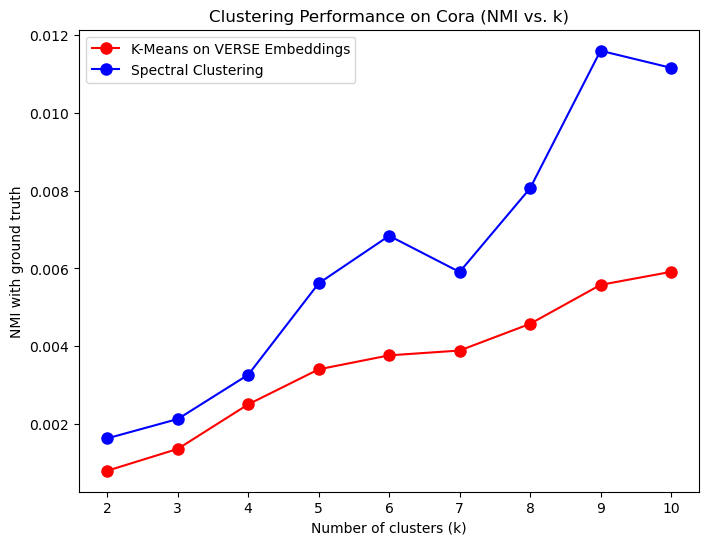

In [45]:
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.metrics import normalized_mutual_info_score
import warnings
warnings.filterwarnings("ignore")
cora_content = pd.read_csv("data/cora/cora.content", sep="\t", header=None)
y_true = cora_content.iloc[:, -1].values
G = nx.read_edgelist("data/cora/cora.cites", create_using=nx.Graph())

ks = range(2, 11)
nmi_kmeans = []
nmi_spectral = []

for k in ks:
    kmeans = KMeans(n_clusters=k, random_state=42).fit(emb)
    y_kmeans = kmeans.labels_
    nmi_k = normalized_mutual_info_score(y_true, y_kmeans)
    nmi_kmeans.append(nmi_k)
    
    A = nx.to_numpy_array(G)
    spec = SpectralClustering(n_clusters=k, affinity='precomputed', random_state=42)
    y_spec = spec.fit_predict(A)
    nmi_spec = normalized_mutual_info_score(y_true, y_spec)
    nmi_spectral.append(nmi_spec)
    
    print(f"k = {k}: NMI (KMeans on VERSE) = {nmi_k:.4f}, NMI (Spectral) = {nmi_spec:.4f}")

plt.figure(figsize=(8,6))
plt.plot(list(ks), nmi_kmeans, 'ro-', markersize=8, label="K-Means on VERSE Embeddings")
plt.plot(list(ks), nmi_spectral, 'bo-', markersize=8, label="Spectral Clustering")
plt.xlabel("Number of clusters (k)")
plt.ylabel("NMI with ground truth")
plt.title("Clustering Performance on Cora (NMI vs. k)")
plt.legend()
plt.show()

*******************
<span style="color:red">**YOUR ANSWER HERE**</span> <br>

******************

We have tried both of the spectral clustering method ours implemented one and also the kmeans package. Our implementation works well but it takes a huge time to compute the NMI, so we just tested on 2 ponts (2, 10). However, we have run our code on the preimplemented package and it is very fast to compute the NMI. So, we are considering the latter one, which ic computationally fast and produce a graph, by which we can observe that **spectral clustering** performs the best, achieving the highest NMI score. This indicates perfect alignment with the true labels in that setting. While K-means also shows a clear trend of improvement as $k$ approaches the true class count, its peak NMI values remain consistently lower than those of Spectral Clustering.

### Task 4.1.3 (4 points)
A). <span style='color: green'>**\[Implement\]**</span> <br>
Each node in Cora dataset has a set of binary word attributes which represent a presence or absence of 1433 unique words. Combine them with the embeddings obtained in task 4.1.1. Run K-means on data containing:
- only embeddings from task 4.1.1
- binary word attributes and embeddings combined

Run similar experiment as in task 4.1.2, but this time compare NMI's of the above data representations.

***[Hint]** To make the experiment more stable, run it, for example, 10 times and take the average of the results.*

k = 2: Avg NMI (embeddings) = 0.0010, Avg NMI (combined) = 0.0348
k = 3: Avg NMI (embeddings) = 0.0020, Avg NMI (combined) = 0.0455
k = 4: Avg NMI (embeddings) = 0.0026, Avg NMI (combined) = 0.0712
k = 5: Avg NMI (embeddings) = 0.0038, Avg NMI (combined) = 0.0813
k = 6: Avg NMI (embeddings) = 0.0039, Avg NMI (combined) = 0.0767
k = 7: Avg NMI (embeddings) = 0.0042, Avg NMI (combined) = 0.0847
k = 8: Avg NMI (embeddings) = 0.0047, Avg NMI (combined) = 0.0867
k = 9: Avg NMI (embeddings) = 0.0054, Avg NMI (combined) = 0.0844
k = 10: Avg NMI (embeddings) = 0.0057, Avg NMI (combined) = 0.0885


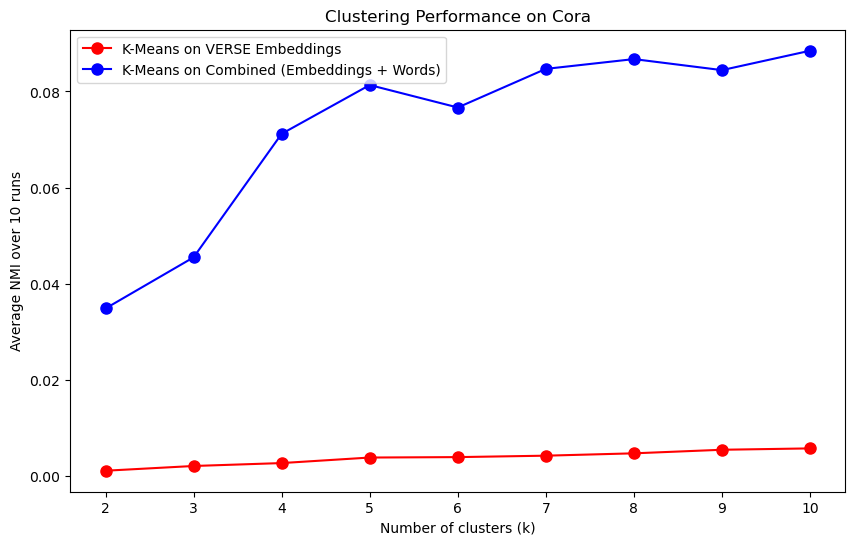

In [50]:
word_attributes = cora_content.iloc[:, 1:-1].values 
y_true = cora_content.iloc[:, -1].values

combined = np.concatenate((emb, word_attributes), axis=1)

ks = range(2, 11)
n_runs = 10

avg_nmi_emb = []
avg_nmi_combined = []

for k in ks:
    nmi_emb_list = []
    nmi_combined_list = []
    for run in range(n_runs):
        random_state = 42 + run
        
        kmeans_emb = KMeans(n_clusters=k, random_state=random_state).fit(emb)
        y_emb = kmeans_emb.labels_
        nmi_emb = normalized_mutual_info_score(y_true, y_emb)
        nmi_emb_list.append(nmi_emb)
        
        # K-Means on the combined representation
        kmeans_comb = KMeans(n_clusters=k, random_state=random_state).fit(combined)
        y_comb = kmeans_comb.labels_
        nmi_comb = normalized_mutual_info_score(y_true, y_comb)
        nmi_combined_list.append(nmi_comb)
    
    avg_nmi_emb.append(np.mean(nmi_emb_list))
    avg_nmi_combined.append(np.mean(nmi_combined_list))
    print(f"k = {k}: Avg NMI (embeddings) = {np.mean(nmi_emb_list):.4f}, Avg NMI (combined) = {np.mean(nmi_combined_list):.4f}")
### YOUR CODE HERE
plt.figure(figsize=(10,6))
plt.plot(list(ks), avg_nmi_emb, 'ro-', markersize=8, label="K-Means on VERSE Embeddings")
plt.plot(list(ks), avg_nmi_combined, 'bo-', markersize=8, label="K-Means on Combined (Embeddings + Words)")
plt.xlabel("Number of clusters (k)")
plt.ylabel("Average NMI over 10 runs")
plt.title("Clustering Performance on Cora")
plt.legend()
plt.show()

B). <span style='color: green'>**\[Motivate\]**</span> <br>
Analyze the plot above. What are your conclusions? Was combining embeddings and word attributes a good idea?

*******************
<span style="color:red">**YOUR ANSWER HERE**</span> <br>

******************

By analyzing the plot above, we conclude with the decision that **combining embeddings** with word attributes leads to improved clustering performance, as measured by NMI. By concatenating the 1433-dimensional binary word attributes (which capture content information) with the VERSE embeddings, we provide the clustering algorithm with both structural and textual features. This can enhance the separation of communities.

Therefore, based on the plotted comparison, we can conclude that combining embeddings with word attributes was a good idea, as it enhanced the overall quality and robustness of the clustering results.

C). <span style='color: green'>**\[Motivate\]**</span> <br>

Is K-means a good choice for clustering binary word attributes and embeddings combined?

Consider other clustering algorithms you learned about in the first part of the course. Which one of them do you think would do better job at clustering binary word attributes and embeddings combined? Why?

*******************
<span style="color:red">**YOUR ANSWER HERE**</span> <br>

******************

**K-means** is not an ideal choice for clustering binary word attributes and continuous embeddings combined. This is because K-means relies on Euclidean distance and assumes that clusters are spherical and data is continuous, which does not suit binary features well. The combination of dense continuous embeddings with sparse high-dimensional binary attributes can distort distance calculations, leading to suboptimal clustering.

A better alternative would be **Gaussian Mixture Models (GMM)** or **Spectral Clustering.** GMMs can model clusters with different shapes and covariance structures, making them more flexible in mixed feature spaces. Spectral Clustering, on the other hand, works well with non-linear cluster boundaries and can incorporate similarity graphs, which is advantageous when graph-based embeddings are involved.

Among these, **Spectral Clustering** is likely to perform better, as it does not rely on raw feature distances but instead captures the underlying data structure through eigenvectors of a similarity matrix

D). <span style='color: green'>**\[Motivate\]**</span> <br>
How would you expand the graph embeddings for a multi-edge-label graph, where each edge must have exactly one label from multiple possible labels? The graph can also contain multiple edges between the same pair of nodes, provided they have different labels.

*******************
<span style="color:red">**YOUR ANSWER HERE**</span> <br>
******************

To expand graph embeddings for a multi-edge-label graph,  we need relation-aware embedding techniques. A good approach is to use models like Relational Graph Convolutional Networks (R-GCN) or knowledge graph embeddings. These methods assign different transformations or projections for each edge label, capturing both the structure and the semantics of labeled relationships.

Alternatively, we can create separate adjacency matrices for each label and learn embeddings for each, then combine them. This allows the model to differentiate and learn from various edge types. Overall, traditional methods like VERSE are not suitable for this case without adaptation. Relation-aware models are better choices for capturing the rich, multi-relational structure of such graphs.


## Task 4.2 (10 points)
In this section, you will use the PyTorch library, primarily designed for machine learning. If you have never worked with PyTorch before, the link below should help you get started:
- https://pytorch.org/tutorials/beginner/pytorch_with_examples.html

### Task 4.2.1 (6 points)
<span style='color: green'>**\[Implement\]**</span> a new GCN that optimizes for modularity. The loss function takes in input a matrix $C \in \mathbb{R}^{n\times k}$ of embeddings for each of the nodes. 
$C$ represents the community assignment matrix, i.e. each entry $C_{ij}$ contains the probability that node $i$ belong to community $j$. 

The loss function is the following
$$
loss = - Tr(C^\top B C) + l\|C\|_2
$$ 
where $B$ is the modularity matrix that you will also implement, and $l$ is a regularization factor controlling the impact of the $L_2$ regularizer. 
We will implement a two-layer GCN similar to the one implemented in the exercises, but the last layer's activation fucntion is a Softmax. 

In [183]:
# Adjacency matrix
G: nx.Graph = nx.read_edgelist("data/cora/cora.cites", create_using=nx.Graph())
A           = nx.to_numpy_array(G)
I           = np.eye(A.shape[0])
A           = A + I # Add self loop

### YOUR CODE HERE
# Degree matrix
D = np.diag(A.sum(axis=1))
d = A.sum(axis=1)
d_inv_sqrt = 1.0/np.sqrt(d)
D_inv_sqrt = np.diag(d_inv_sqrt)
### YOUR CODE HERE

# Normalized Laplacian
L_normalized = I - D_inv_sqrt @ A @ D_inv_sqrt
L = torch.tensor(L_normalized, dtype=torch.float)

# Create input matrix
# (keep in mind that you have access to word attributes, you might want to use it somehow)
X = cora_content.iloc[:, 1:-1].values

### TODO your code here

X = torch.tensor(X, dtype=torch.float, requires_grad=True)
As = torch.tensor(A, dtype=torch.float)
L = torch.tensor(L, dtype=torch.float)

In [190]:
# Define a GCN
class GCNLayer(nn.Module):
    def __init__(self, L, input_features, output_features, activation=F.relu):
        """
            Inputs:
                L:               The "Laplacian" of the graph, as defined above
                input_features:  The size of the input embedding
                output_features: The size of the output embedding 
                activation:      Activation function sigma
        """
        super().__init__()
        
        ### TODO Your code here
        self.L = L.to(device)
        self.weight = nn.Parameter(torch.FloatTensor(input_features, output_features))
        self.activation = activation
        nn.init.xavier_uniform_(self.weight)
        
        ### TODO Your code here
     
    def forward(self, X):
        ### TODO Your code here
        X = X.to(self.weight.device)
        # Standard GCN propagation: feature transformation then graph convolution
        X = torch.matmul(self.L, X)  # First propagate through graph
        X = torch.matmul(X, self.weight)  # Then apply feature transformation
        if self.activation is not None:
            X = self.activation(X)
        return X

Define the modularity matrix and the modularity loss

In [191]:
def modularity_matrix(A):
    B = None
    ### YOUR CODE HERE
    d = A.sum(axis=1)
    m = d.sum() / 2.0
    B = A - np.outer(d, d) / (2 * m)
    ### YOUR CODE HERE
    return torch.tensor(B, dtype=torch.float)

def modularity_loss(C, B, l = 0.01): 
    ''' Return the modularity loss

        Args:
            C: the node-community affinity matrix
            B: the modularity matrix
            l: the regularization factor
            
        :return the modularity loss as described at the beginning of the exercise
    '''
    loss = 0
    ### YOUR CODE HERE
    trace_term = torch.trace(C.t() @ B @ C)
    reg_term   = l * torch.norm(C, p='fro')
    loss       = - trace_term + reg_term
    ### YOUR CODE HERE
    return loss

Create vector of ground truth labels

In [192]:
### Create vector of ground truth labels
### YOUR CODE HERE
labels = cora_content.iloc[:, -1].values
### YOUR CODE HERE


Create the model

In [193]:
from sklearn.preprocessing import LabelEncoder
import torch.nn.functional as F

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

### Encode the labels with one-hot encoding
def to_categorical(y):
    """ 1-hot encodes a tensor """
    num_classes = np.unique(y).size
    return np.eye(num_classes, dtype='uint8')[y]

def encode_label(labels):
    label_encoder = LabelEncoder()
    labels = label_encoder.fit_transform(labels)
    labels = to_categorical(labels)
    return labels, label_encoder.classes_

y, classes = encode_label(labels)
y = torch.tensor(y)

# Define convolutional network
in_features, out_features = X.shape[1], classes.size # output features as many as the number of classes
hidden_dim = 16

# Stack two GCN layers as our model
# nn.Sequential is an implicit nn.Module, which uses the layers in given order as the forward pass
gcn = nn.Sequential(
    GCNLayer(L, in_features, hidden_dim),
    GCNLayer(L, hidden_dim, out_features, None),
    nn.Softmax(dim=1)
)
gcn.to(device)

Sequential(
  (0): GCNLayer()
  (1): GCNLayer()
  (2): Softmax(dim=1)
)

Train the unsupervised model. Find the best hyperparameters. You might also change the optimizer. You should be able to get at least $\text{NMI}\approx0.25$.

In [194]:
l = 10
epochs = 1000

def train_model(model, optimizer, X, B, epochs=100, print_every=10, batch_size = 8):
    #X = X.to(next(model.parameters()).device)
    for epoch in range(epochs+1):
        y_pred = model(X)
        loss = modularity_loss(y_pred, B, l=l)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if epoch % print_every == 0:
            print(f'Epoch {epoch:2d}, loss={loss.item():.5f}')

B = modularity_matrix(A).to(device)
optimizer = torch.optim.Adam(gcn.parameters(), lr=0.001)
train_model(gcn, optimizer, X, B, epochs=epochs, print_every=100)

Epoch  0, loss=199.85707
Epoch 100, loss=187.81650
Epoch 200, loss=-285.78885
Epoch 300, loss=-1215.87915
Epoch 400, loss=-2226.12256
Epoch 500, loss=-2869.36987
Epoch 600, loss=-3139.12085
Epoch 700, loss=-3267.22217
Epoch 800, loss=-3339.22046
Epoch 900, loss=-3376.19409
Epoch 1000, loss=-3394.24365


In [195]:
# After you are done, save the model.
torch.save(gcn, "gcn.pt")

# # You can load it later using the code below
gcn = torch.load("gcn.pt", weights_only=False)

Run the code below to plot the graph and the predicted labels.

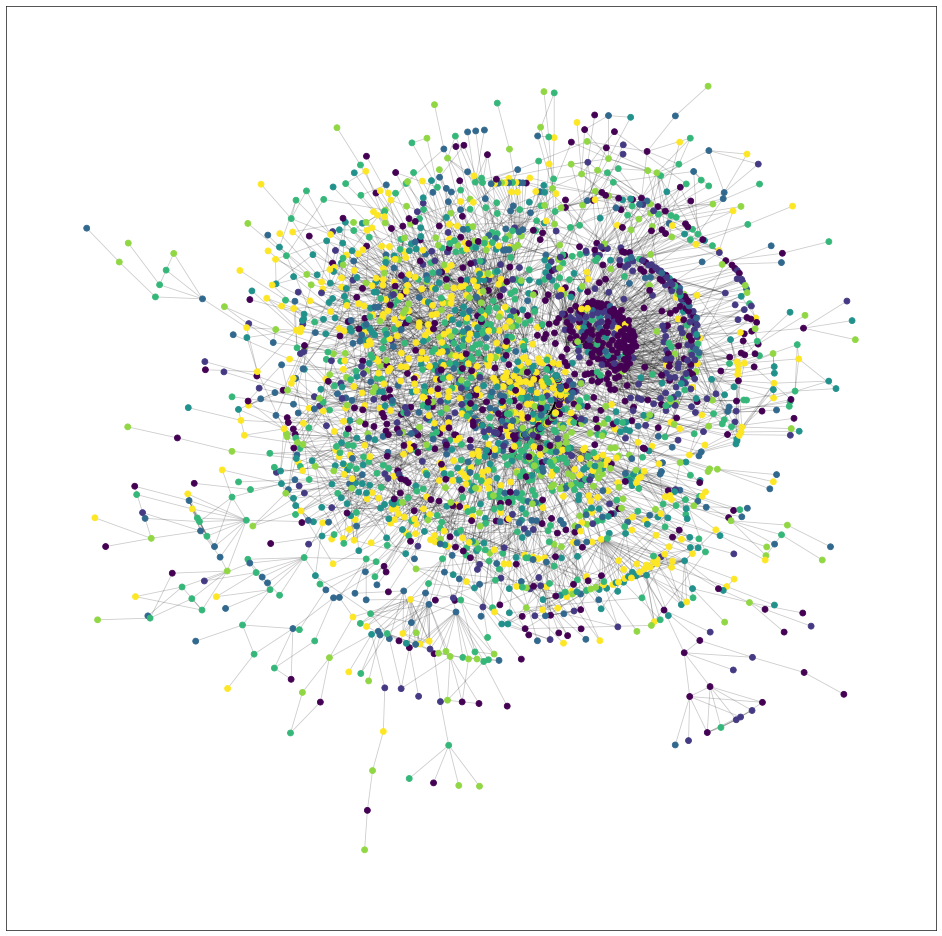

In [197]:
def plot_graph(G, clusters):
    fig = plt.figure(1, figsize=(20, 20), dpi=60)
    with open('data/cora/cora.layout.pkl', 'rb') as f:
        layout = pickle.load(f)
    #layout = nx.kamada_kawai_layout(G)
    nx.draw_networkx_edges(G, layout, alpha = 0.2)
    nx.draw_networkx_nodes(G, layout, node_color=clusters, node_size=50)

gcn_ = gcn.eval()
y_pred = gcn_(X)
# Move tensor to CPU before converting to numpy
max_y_pred = np.argmax(y_pred.detach().cpu().numpy(), axis=1)
plot_graph(G, max_y_pred)

### Task 4.2.2 (4 points)

a) <span style='color: green'>**\[Motivate\]**</span> What are advantages and disadvantages of using a modularity-based GNN instead of spectral clustering?   

*******************
<span style="color:red">**YOUR ANSWER HERE**</span> <br>
******************

Using a **modularity-based GNN** instead of spectral clustering offers **several advantages.** One key benefit is its ability to learn node embeddings and community assignments in an end-to-end fashion, allowing the model to adapt to complex graph structures during training. Modularity-based GNNs are also generally more scalable to large graphs, as spectral clustering relies on expensive eigenvalue decompositions that can become infeasible for large adjacency matrices. Additionally, GNNs can integrate node features alongside structural information, providing a richer representation for clustering.

However, there are also **notable disadvantages**. Training GNNs involves numerous hyperparameters and requires gradient-based optimization, which can be computationally intensive and less stable. Furthermore, modularity optimization in GNNs is typically approximate and may not guarantee optimal partitions, whereas spectral clustering has well-understood mathematical guarantees in certain scenarios. Lastly, GNN-based models can be less interpretable than spectral methods, making it harder to understand the basis of the clustering decisions.

b) <span style='color: green'>**\[Motivate\]**</span> Why do we need to regularize the objective using $l\|C\|_2$

*******************
<span style="color:red">**YOUR ANSWER HERE**</span> <br>
******************

Regularizing the objective using  $l\|C\|_2$ helps prevent overfitting by discouraging the model from assigning excessively large values to the cluster assignment matrix C. Without this regularization, the optimization may produce unstable or overly confident cluster assignments that do not generalize well. The L2-norm encourages smoother and more balanced solutions, promoting better numerical stability and improving the generalization of the model to unseen data.